## Data BritishMart

In [ ]:
!pip install xgboost

In [ ]:
!pip install lightgbm

In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 5.2 MB/s eta 0:00:00


In [ ]:
# Langkah 1 : Import library yang dibutuhkan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import datetime
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from catboost import CatBoostRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

In [ ]:
# Import data dari file CSV
df_b = pd.read_csv('/content/BritishMart.csv')
df_b #menampilkan data

,nama_toko,harga_pound,harga_per_unit,unit,nama,kategori,brand_sendiri,tanggal
0,BritishMart,1.35,1.35,l,Alpro Oat Long Life Drink,drinks,False,2021-01-01
1,BritishMart,2.10,2.10,l,Alpro Almond Chilled Drink,drinks,False,2021-01-01
2,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Strawberr…,drinks,False,2021-01-01
3,BritishMart,2.10,2.10,l,Alpro Soya Chilled Drink,drinks,False,2021-01-01
4,BritishMart,1.00,0.70,l,Volvic Touch of Fruit Lemon & Lim…,drinks,False,2021-01-01
...,...,...,...,...,...,...,...,...
979861,BritishMart,9.50,9.50,unit,Morrisons Wooden Rectangular Paddleboard,home,True,2022-02-26
979862,BritishMart,3.00,3.00,unit,Morrisons Wooden Turner,home,True,2022-02-27
979863,BritishMart,2.00,2.00,unit,Talking Tables Metallic Gold Slogan Napkin,home,False,2022-02-28
979864,BritishMart,25.00,25.00,unit,Tcp Smart Led Double Switch,home,False,2022-03-01


In [ ]:
# data type
print("Tipe data setiap kolom:")
print(df_b.dtypes)
print()

# jumlah kolom dan baris
baris, kolom = df_b.shape
print(f"Jumlah baris: {baris}")
print(f"Jumlah kolom: {kolom}")
print()

# informasi umum df
print("Informasi umum tentang DataFrame:")
print(df_b.info())

Tipe data setiap kolom:
nama_toko          object
harga_pound       float64
harga_per_unit    float64
unit               object
nama               object
kategori           object
brand_sendiri        bool
tanggal            object
dtype: object

Jumlah baris: 979866
Jumlah kolom: 8

Informasi umum tentang DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 979866 entries, 0 to 979865
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   nama_toko       979866 non-null  object 
 1   harga_pound     979866 non-null  float64
 2   harga_per_unit  979866 non-null  float64
 3   unit            979866 non-null  object 
 4   nama            979866 non-null  object 
 5   kategori        979866 non-null  object 
 6   brand_sendiri   979866 non-null  bool   
 7   tanggal         979866 non-null  object 
dtypes: bool(1), float64(2), object(5)
memory usage: 53.3+ MB
None


# Data Preprocessing

In [ ]:
# cek missing value di semua kolom df
missing_values_count = df_b.isnull().sum()
missing_values_count

nama_toko         0
harga_pound       0
harga_per_unit    0
unit              0
nama              0
kategori          0
brand_sendiri     0
tanggal           0
dtype: int64

Terlihat bahwa data tidak terdapat missing value

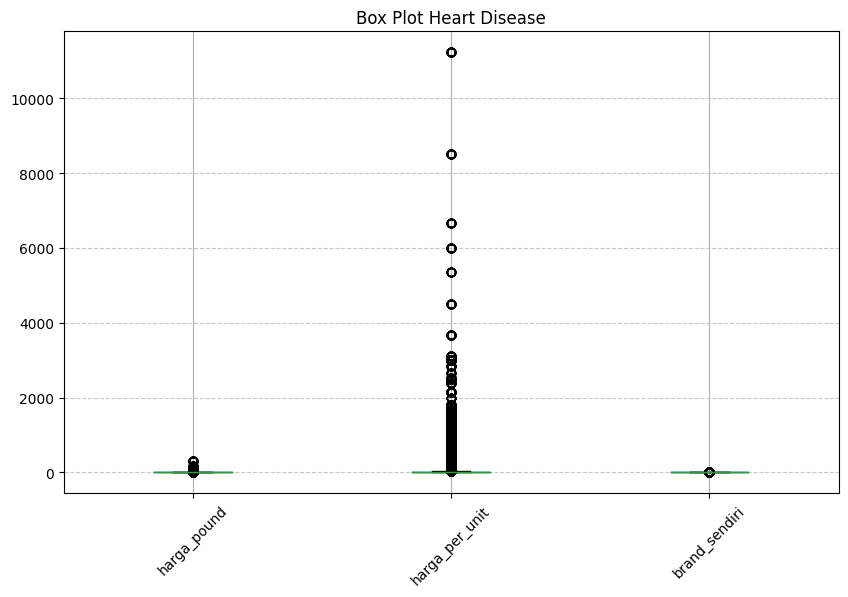

In [ ]:
# menampilkan boxplot untuk melihat apakah ada outlier di tiap kolom
plt.figure(figsize=(10, 6))
df_b.boxplot()
plt.title('Box Plot Heart Disease')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Untuk masalah data outlier & duplicate tidak perlu dilakukan tindakan apapun dikarenakan akan berdampak pada total penjualan yang akan memengaruhi analisis dan pemodelan pada tahap selanjutnya

##Eksploratori Data Analysis (EDA)

1. Analisis Distribusi dari Kategori brand_sendiri

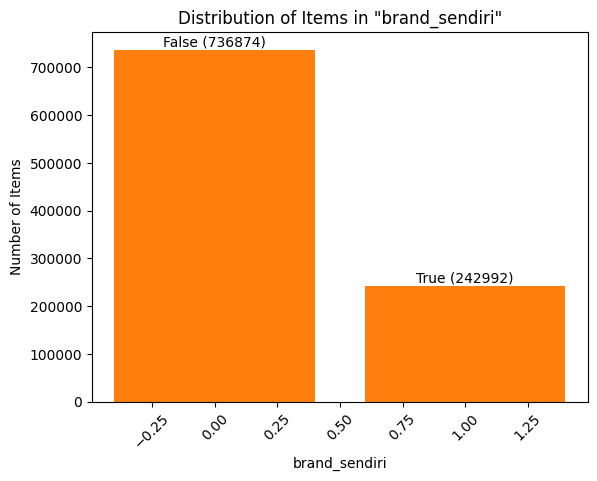

Unique brand_sendiri:
[False, True]


In [ ]:
#Langkah 2 : Menghitung item dalam setiap kategori brand_sendiri
n_item_per_brand_sendiri = df_b['brand_sendiri'].value_counts().sort_values(ascending=False)

#Langkah 3 : Membuat diagram batang
plt.bar(n_item_per_brand_sendiri.index, n_item_per_brand_sendiri.values)
plt.xlabel('brand_sendiri')  # Label for x-axis
plt.ylabel('Number of Items')  # Label for y-axis
plt.title('Distribution of Items in "brand_sendiri"')

#Langkah 4 : Menambahkan label ke setiap batang dengan nilai kategori dan jumlah
patches = plt.bar(n_item_per_brand_sendiri.index, n_item_per_brand_sendiri.values)
for patch, count, category in zip(patches, n_item_per_brand_sendiri.values, n_item_per_brand_sendiri.index):
    plt.text(patch.get_x() + patch.get_width() / 2, patch.get_height() + 0.1, f"{category} ({int(count)})", ha='center', va='bottom')

#Langkah 5 : Memutar label sumbu x untuk kejelasan yang lebih baik
plt.xticks(rotation=45)
plt.show()

#Langkah 6 : Mencetak kategori unik (sudah termasuk dalam kode Anda)
print("Unique brand_sendiri:")
print(n_item_per_brand_sendiri.index.to_list())

Terlihat bahwa ternyata produk di BritishMart lebih banyak dari brand luar daripada brand BritishMart

2. Analisis Tren Perbulan dari Total Pendapatan di BritishMart

In [ ]:
#Langkah 2 : Konversi kolom 'tanggal' ke datetime
df_b['tanggal'] = pd.to_datetime(df_b['tanggal'])

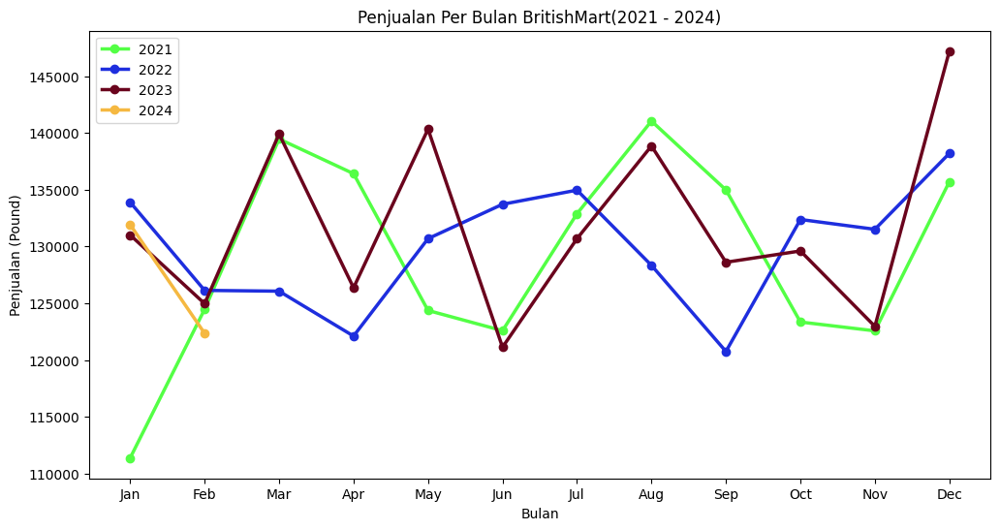

In [ ]:
#Langkah 3 :Ekstraksi bulan dan tahun dari kolom tanggal
df_b['bulan'] = df_b['tanggal'].dt.month
df_b['tahun'] = df_b['tanggal'].dt.year

#Langkah 4 :Analisis penjualan per bulan di tahun 2021
sales_2021 = df_b[df_b['tahun'] == 2021]
monthly_sales_2021 = sales_2021.groupby('bulan')['harga_pound'].sum()

#Langkah 5 : Analisis penjualan per bulan di tahun 2022
sales_2022 = df_b[df_b['tahun'] == 2022]
monthly_sales_2022 = sales_2022.groupby('bulan')['harga_pound'].sum()

#Langkah 6 : Analisis penjualan per bulan di tahun 2023
sales_2023 = df_b[df_b['tahun'] == 2023]
monthly_sales_2023 = sales_2023.groupby('bulan')['harga_pound'].sum()

#Langkah 7 :Analisis penjualan per bulan di tahun 2024
sales_2024 = df_b[df_b['tahun'] == 2024]
monthly_sales_2024 = sales_2024.groupby('bulan')['harga_pound'].sum()

#Langkah 8 :Visualisasi Data: Grafik Penjualan Per Bulan di Tahun 2021, 2022, dan 2023
plt.figure(figsize=(12, 6))

#Langkah 9 : Membuat plot
# Plot untuk tahun 2021
plt.plot(monthly_sales_2021.index, monthly_sales_2021.values, linestyle='-', marker='o', label='2021', color='#53FF45', linewidth='2.5')

# Plot untuk tahun 2022
plt.plot(monthly_sales_2022.index, monthly_sales_2022.values, linestyle='-', marker='o', label='2022', color='#1E2EDE', linewidth='2.5')

# Plot untuk tahun 2023
plt.plot(monthly_sales_2023.index, monthly_sales_2023.values, linestyle='-', marker='o', label='2023', color='#6A041D', linewidth='2.5')

# Plot untuk tahun 2024
plt.plot(monthly_sales_2024.index, monthly_sales_2024.values, linestyle='-', marker='o', label='2024', color='#F5B841', linewidth='2.5')

plt.title('Penjualan Per Bulan BritishMart(2021 - 2024)')
plt.xlabel('Bulan')
plt.ylabel('Penjualan (Pound)')
plt.grid(False)
plt.xticks(range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.show()

Interpretasi :
- Pada tahun 2021 dapat dilihat terjadi kenaikan secara drastis dibulan februari sampai bulan maret hingga mencapai titik total pendapatan 1400000 dan mengalami penurunan dari bulan april hingga juni, setelah itu total penjualan naik kembali hingga bulan agustus mencapai +1400000, kemudian total penjualan turun dari bulan september hingga november dengan total pendapatan dibawah 125000, dan mengalami kenaikan diakhir bulan
- Pada tahun 2022 dapat dilihat terjadi penurunan dibulan februari hingga april dan mengalami penurunan drastis pada bulan september lalu kembali naik di akhir bulan
- Pada tahun 2023 dapat dilihat juga terjadi penurunan di awal tahun tapi kembali meningkat dibulan maret, pada tahun 2023 terjadi tren naik turun yang cukup pesat, terlebih lagi kenaikan pada akhir tahun
- Pada tahun 2024 dibulan januari hingga februari terjadi penurunan yang lebih tinggi hingga dibawah titik total penjualan dibawah 125000 jika dilihat dari tahun-tahun sebelumnya, hal ini bisa jadi berpengaruh untuk total penjualan bulan berikutnya tahun 2024

3. Analisis Tren Pertahun dari Total Pendapatan di BritishMart


Penjualan Tahunan BritishMart:
tahun
2021    1549179.76
2022    1558739.31
2023    1581626.26
Name: harga_pound, dtype: float64


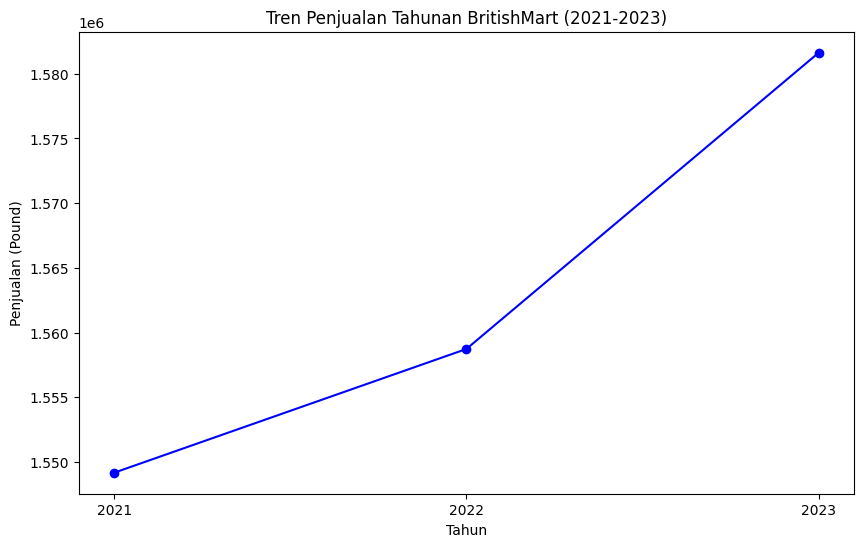

selisih penurunan penjualan dari tahun ke tahun sebagai berikut (pounds) 
 tahun
2021         NaN
2022     9559.55
2023    22886.95
Name: harga_pound, dtype: float64


In [ ]:
#Langkah 2 :Ekstraksi tahun dari kolom tanggal
df_b['tahun'] = df_b['tanggal'].dt.year

#Langkah 3 :Filter hanya tahun 2021-2023
yearly_sales = df_b[(df_b['tahun'] >= 2021) & (df_b['tahun'] <= 2023)].groupby('tahun')['harga_pound'].sum()

print("\nPenjualan Tahunan BritishMart:")
print(yearly_sales)

#Langkah 4 : Mendapatkan tahun dengan penjualan tertinggi
tahun_tertinggi = yearly_sales.idxmax()

#Langkah 5 : Visualisasi Data
#(Contoh: Grafik Tren Penjualan Tahunan)
plt.figure(figsize=(10, 6))

# Bar warna default
bars = plt.plot(yearly_sales.index, yearly_sales.values, marker='o', color="blue", label=yearly_sales)

plt.title('Tren Penjualan Tahunan BritishMart (2021-2023)')
plt.xlabel('Tahun')
plt.ylabel('Penjualan (Pound)')
plt.grid(False)
plt.xticks(yearly_sales.index)  # Setiap tahun sebagai label sumbu x
plt.show()

perkembangan_penjualan = yearly_sales.diff()

print('selisih penurunan penjualan dari tahun ke tahun sebagai berikut (pounds) \n', perkembangan_penjualan)

Dari tahun 2021 hingga 2023 total penjualan BrtishMart mengalami peningkatan yang cukup pesat, hal ini dipengaruhi oleh strategi pemasaran dan hal lain yang bisa dijadikan acuan untuk toko lainnya

Note : Mengabaikan tahun 2024 karena data tahun 2024 baru bulan 1 dan 2

4. Analisa Harga Rata-Rata per Kategori

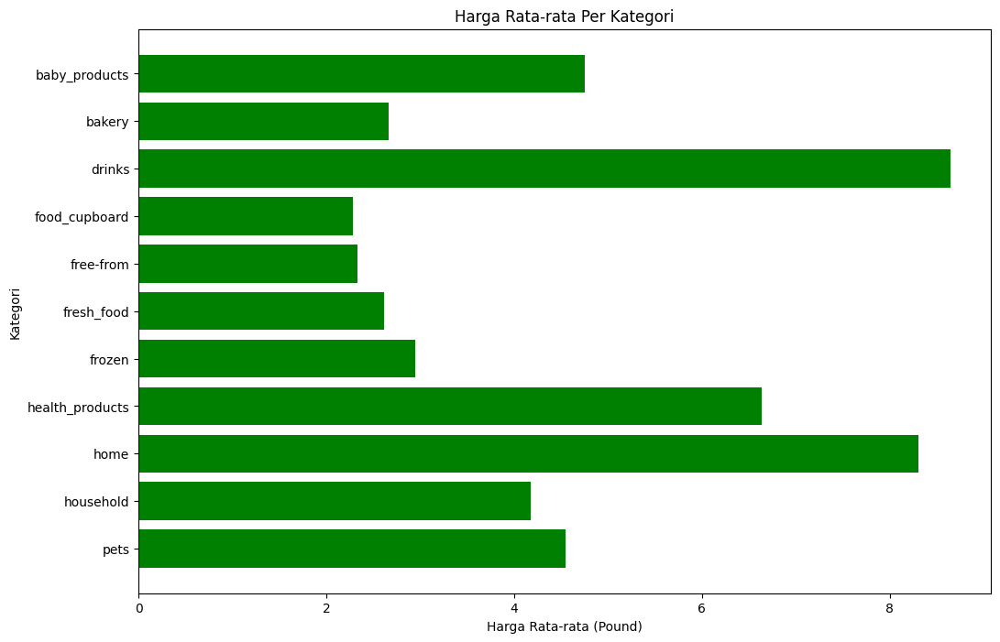

In [ ]:
#Langkah 2 : Menghitung harga rata-rata per kategori
harga_rata_per_kategori = df_b.groupby('kategori')['harga_pound'].mean().reset_index()
harga_rata_per_kategori.columns = ['kategori', 'harga_rata_pound']

#Langkah 3 :  Plot harga rata-rata per kategori
plt.figure(figsize=(12, 8))
plt.barh(harga_rata_per_kategori['kategori'], harga_rata_per_kategori['harga_rata_pound'], color='green')
plt.xlabel('Harga Rata-rata (Pound)')
plt.ylabel('Kategori')
plt.title('Harga Rata-rata Per Kategori')
plt.gca().invert_yaxis()
plt.show()

- Dari kategori home, drink, health product, baby_product, pets memiliki rata-rata harga yg tinggi
- Dan dari kategori food_cupboard, free-form, fresh-food, bakery, frozen memiliki rata-rata harga rendah


Harga rata-rata kategori drinks tergolong cukup tinggi dan kurang masuk akal karena dapat dilihat ada kategori health product dan home yang lebih masuk akal dengan harga tinggi, jika diasumsikan harusnya kategori drinks harusnya tidak jauh dari kategori food_cupboard atau fresh_food

5. Analisis Total Penjualan per Kategori

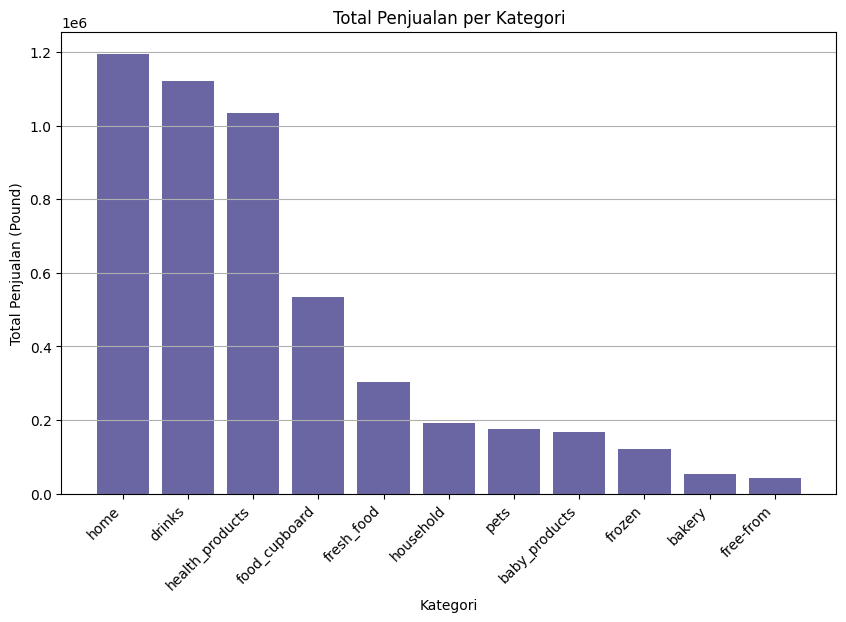

Kategori yang paling banyak dibeli dari toko BritishMart adalah 'home' dengan total penjualan sebesar 1195576.24 Pound.


In [ ]:
kategori_sales = df_b.groupby('kategori')['harga_pound'].sum().sort_values(ascending=False)

#Langkah 2 : Visualisasi Data: Bar Chart Kategori Penjualan
plt.figure(figsize=(10, 6))

#Langkah 3 : Visualisasi
# Bar chart kategori penjualan
plt.bar(kategori_sales.index, kategori_sales.values, color='#6A66A3')

plt.title('Total Penjualan per Kategori')
plt.xlabel('Kategori')
plt.ylabel('Total Penjualan (Pound)')
plt.xticks(rotation=45, ha='right')  # Memutar label sumbu x untuk menghindari tumpang tindih
plt.grid(axis='y')  # Menampilkan grid hanya pada sumbu y untuk referensi

plt.show()

# Kategori dengan penjualan terbanyak
kategori_terbanyak = kategori_sales.idxmax()
total_penjualan_terbanyak = kategori_sales.max()
print(f"Kategori yang paling banyak dibeli dari toko BritishMart adalah '{kategori_terbanyak}' dengan total penjualan sebesar {total_penjualan_terbanyak} Pound.")

6. Analisis Jumlah Varian Produk yang Dijual per Kategori

           kategori  jumlah_varian_produk
3     food_cupboard                  6070
8              home                  3996
7   health_products                  3924
2            drinks                  3187
5        fresh_food                  3105
9         household                  1246
6            frozen                  1119
0     baby_products                   899
10             pets                   887
1            bakery                   517
4         free-from                   426


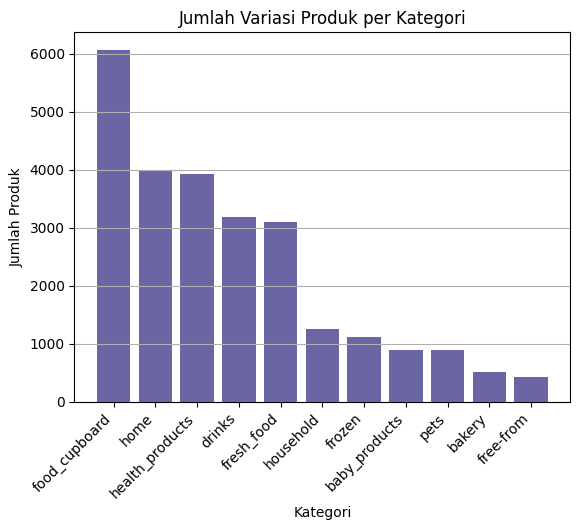

In [ ]:
#Langkah 2 : Menghitung jumlah produk yang dijual per kategori
jumlah_varian_produk_per_kategori = df_b.groupby('kategori')['nama'].nunique().reset_index()
jumlah_varian_produk_per_kategori = jumlah_varian_produk_per_kategori.rename(columns={'nama': 'jumlah_varian_produk'})

#Langkah 3 : Mengurutkan data berdasarkan jumlah produk dari yang terbanyak ke yang paling sedikit
jumlah_varian_produk_per_kategori_sorted = jumlah_varian_produk_per_kategori.sort_values(by='jumlah_varian_produk', ascending=False)

#Langkah 4 : Menampilkan hasil
print(jumlah_varian_produk_per_kategori_sorted)

#Langkah 5 : Visualisasi
# Membuat plot batang
plt.bar(jumlah_varian_produk_per_kategori_sorted['kategori'], jumlah_varian_produk_per_kategori_sorted['jumlah_varian_produk'], color='#6A66A3')

# Menambahkan judul dan label sumbu
plt.title('Jumlah Variasi Produk per Kategori')
plt.xlabel('Kategori')
plt.ylabel('Jumlah Produk')

# Memutar label sumbu x untuk menghindari tumpang tindih
plt.xticks(rotation=45, ha='right')

# Menampilkan grid hanya pada sumbu y
plt.grid(axis='y')

# Menampilkan plot
plt.show()

7. Analisis Kategori Produk yang Paling Diminati Berdasarkan Total Produk yang Terjual

kategori
food_cupboard      234953
health_products    156042
home               143988
drinks             129743
fresh_food         115955
household           45911
frozen              41537
pets                38529
baby_products       35503
bakery              19963
free-from           17742
Name: count, dtype: int64


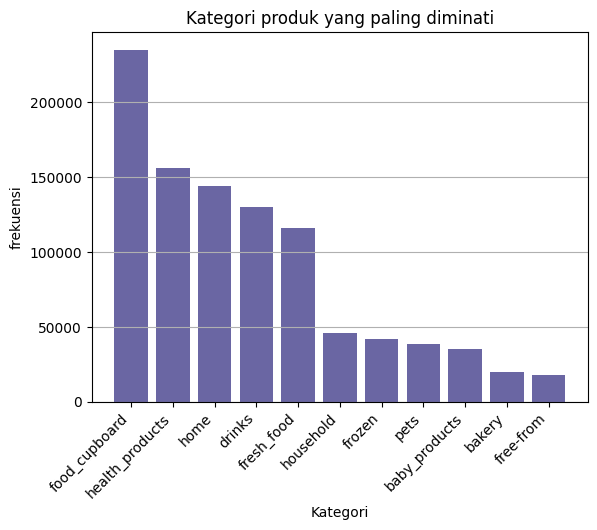

In [ ]:
total_terjual = df_b['kategori'].value_counts()
print(total_terjual)
plt.bar(total_terjual.index, total_terjual.values, color='#6A66A3')

plt.title('Kategori produk yang paling diminati')
plt.xlabel('Kategori')
plt.ylabel('frekuensi')
plt.xticks(rotation=45, ha='right')  # Memutar label sumbu x untuk menghindari tumpang tindih
plt.grid(axis='y')  # Menampilkan grid hanya pada sumbu y untuk referensi

plt.show()

Terlihat bahwa food_cupboard adalah kategori yang diminati berdasarkan total item yang terjual yaitu sebanyak 234953

##EDA & Machine Learning


##a. fresh_food

In [ ]:
#Langkah 2 : Pilih kategori produk tertentu
kategori_produk = 'fresh_food'

#Langkah 3 : Filter DataFrame untuk 10 produk teratas dalam kategori tertentu
produk_top10 = df_b[df_b['kategori'] == kategori_produk]['nama'].value_counts().head(50).index
produk_filter = df_b['nama'].isin(produk_top10)

#Langkah 4 : Filter DataFrame berdasarkan kategori dan rentang tahun
tahun_filter = (df_b['tahun'] >= 2021) & (df_b['tahun'] <= 2024)
kategori_filter = df_b['kategori'] == kategori_produk
df_filtered = df_b[produk_filter & tahun_filter & kategori_filter]

#Langkah 5 : Mengelompokkan berdasarkan nama produk, dan menghitung jumlah harga yang berbeda
jumlah_harga_berbeda_per_produk = df_filtered.groupby('nama')['harga_pound'].nunique()

#Langkah 6 : Filter produk yang memiliki lebih dari satu harga
produk_dengan_perubahan_harga = jumlah_harga_berbeda_per_produk[jumlah_harga_berbeda_per_produk > 1].index

#Langkah 7 : Filter DataFrame untuk hanya menyertakan produk dengan perubahan harga
df_filtered = df_filtered[df_filtered['nama'].isin(produk_dengan_perubahan_harga)]

#Langkah 8 : Mengelompokkan berdasarkan nama, harga, tahun, dan bulan
grouped = df_filtered.groupby(['nama', 'harga_pound', 'tahun', 'bulan']).size().reset_index(name='count')

#Langkah 9 : Menghitung jumlah bulan unik untuk setiap produk dan harga
jumlah_bulan_per_produk = grouped.groupby(['nama', 'harga_pound']).size().reset_index(name='jumlah_bulan')

#Langkah 10 : Menghitung frekuensi harga yang terjadi pada produk
frekuensi_harga_per_produk = df_filtered.groupby(['nama', 'harga_pound']).size().reset_index(name='frekuensi_harga')

#Langkah 11 : Gabungkan dengan DataFrame jumlah_bulan_per_produk
jumlah_bulan_per_produk = jumlah_bulan_per_produk.merge(frekuensi_harga_per_produk, on=['nama', 'harga_pound'])

#Langkah 12 : Menambahkan kolom baru untuk hasil perkalian antara harga dan frekuensi harga
jumlah_bulan_per_produk['total_harga_perubahan'] = jumlah_bulan_per_produk['harga_pound'] * jumlah_bulan_per_produk['frekuensi_harga']

#Langkah 13 : Menampilkan hasil
jumlah_bulan_per_produk

,nama,harga_pound,jumlah_bulan,frekuensi_harga,total_harga_perubahan
0,Activia Peach 0% Fat Yogurt,1.25,1,1,1.25
1,Activia Peach 0% Fat Yogurt,1.50,13,18,27.00
2,Activia Peach 0% Fat Yogurt,1.75,11,16,28.00
3,Activia Peach 0% Fat Yogurt,2.50,12,14,35.00
4,Genuine Coconut Organic Drinking Coconut,1.50,14,19,28.50
5,Genuine Coconut Organic Drinking Coconut,1.99,24,30,59.70
6,Morrisons Brown Onions,0.99,36,46,45.54
7,Morrisons Brown Onions,1.35,3,3,4.05
8,Morrisons Carrots,0.50,2,2,1.00
9,Morrisons Carrots,0.60,1,1,0.60


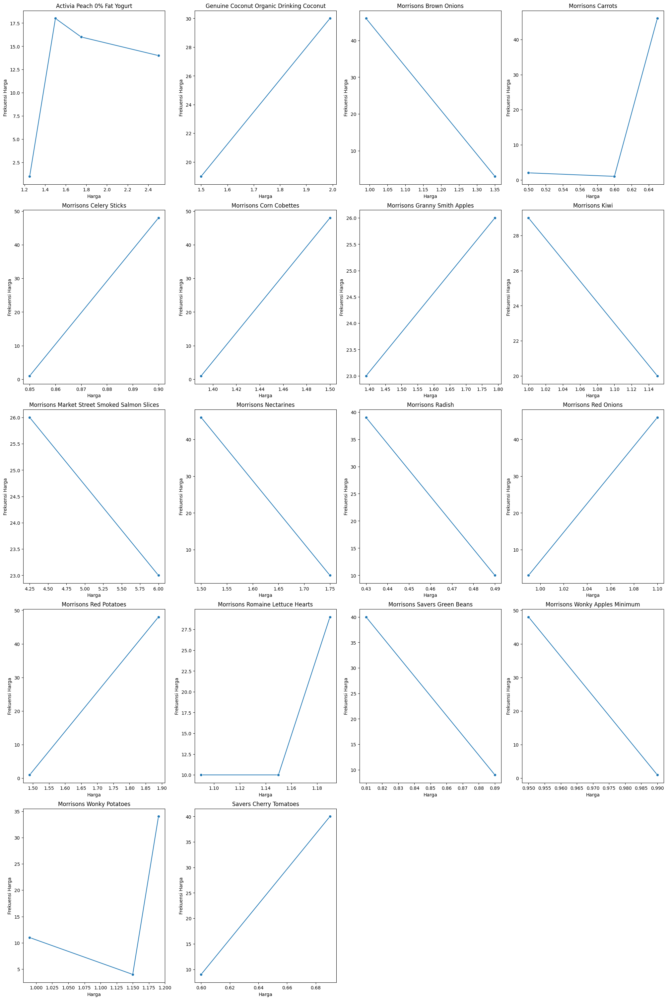

In [ ]:
#Langkah 2 :  Membuat plot untuk setiap produk
produk_list = jumlah_bulan_per_produk['nama'].unique()
n_produks = len(produk_list)
max_cols = 4
n_rows = math.ceil(n_produks / max_cols)

fig, axs = plt.subplots(nrows=n_rows, ncols=max_cols, figsize=(5*max_cols, 6*n_rows), constrained_layout=True)

for i, produk in enumerate(produk_list):
    row = i // max_cols
    col = i % max_cols
    produk_data = jumlah_bulan_per_produk[jumlah_bulan_per_produk['nama'] == produk]
    sns.lineplot(ax=axs[row, col], x='harga_pound', y='frekuensi_harga', data=produk_data, marker='o')
    axs[row, col].set_title(produk)
    axs[row, col].set_xlabel('Harga')
    axs[row, col].set_ylabel('Frekuensi Harga')

#Langkah 3 : Menghapus subplot kosong jika ada
for j in range(i + 1, n_rows * max_cols):
    fig.delaxes(axs.flat[j])
plt.show()

In [ ]:
#Langkah 2 :  Pilih kategori produk
kategori_produk = 'fresh_food'

#Langkah 3 : Filter DataFrame berdasarkan kategori
kategori_filter = df_b['kategori'] == kategori_produk
df_filtered = df_b[kategori_filter]

#Langkah 3 : Mengelompokkan berdasarkan nama produk, dan menghitung jumlah harga yang berbeda
jumlah_harga_berbeda_per_produk = df_filtered.groupby('nama')['harga_pound'].nunique()

#Langkah 4 :  Mengelompokkan berdasarkan nama, harga, tahun, dan bulan
grouped = df_filtered.groupby(['nama', 'harga_pound', 'tahun', 'bulan']).size().reset_index(name='count')

#Langkah 5 :  Menghitung jumlah bulan unik untuk setiap produk, harga, dan tahun
fresh_food_analyze = grouped.groupby(['nama', 'harga_pound', 'tahun']).size().reset_index(name='jumlah_bulan')

#Langkah 6 :  Menghitung frekuensi harga yang terjadi pada produk
frekuensi_penjualan_per_produk = df_filtered.groupby(['nama', 'harga_pound', 'tahun']).size().reset_index(name='frekuensi_penjualan')

#Langkah 7 : Gabungkan dengan DataFrame fresh_food_analyze
fresh_food_analyze = fresh_food_analyze.merge(frekuensi_penjualan_per_produk, on=['nama', 'harga_pound', 'tahun'])

#Langkah 8 : Menambahkan kolom baru untuk hasil perkalian antara harga dan frekuensi harga
fresh_food_analyze['penjualan'] = fresh_food_analyze['harga_pound'] * fresh_food_analyze['frekuensi_penjualan']

#Langkah 9 : Menambahkan kolom untuk menghitung frekuensi penjualan setahun
fresh_food_analyze['frekuensi_penjualan_setahun'] = fresh_food_analyze['frekuensi_penjualan'] * (12 / fresh_food_analyze['jumlah_bulan'])

#Langkah 10 : Menampilkan hasil
fresh_food_analyze

,nama,harga_pound,tahun,jumlah_bulan,frekuensi_penjualan,penjualan,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,2,3,11.25,18.000000
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,5,6,22.50,14.400000
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,1,1,2.75,12.000000
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,1,2,7.50,24.000000
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,5,6,22.50,14.400000
...,...,...,...,...,...,...,...
12997,Young's Scottish Tradit…,3.75,2021,2,3,11.25,18.000000
12998,Young's Scottish Tradit…,4.00,2021,4,5,20.00,15.000000
12999,Young's Scottish Tradit…,4.00,2022,11,13,52.00,14.181818
13000,Young's Scottish Tradit…,4.00,2023,12,18,72.00,18.000000


In [ ]:
#Langkah 2 :  Memilih hanya kolom yang diinginkan
df_filtered = fresh_food_analyze[['nama', 'harga_pound', 'tahun', 'frekuensi_penjualan_setahun']]
#df_baru =df_filtered[df_filtered['tahun'] != 2024]

#Langkah 3 : Menampilkan DataFrame hasil filter
#df_baru
df_filtered

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.000000
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,14.400000
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.000000
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.000000
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,14.400000
...,...,...,...,...
12997,Young's Scottish Tradit…,3.75,2021,18.000000
12998,Young's Scottish Tradit…,4.00,2021,15.000000
12999,Young's Scottish Tradit…,4.00,2022,14.181818
13000,Young's Scottish Tradit…,4.00,2023,18.000000


In [ ]:
# Menambahkan kolom 'kategori_produk' dengan nilai 'fresh_foods'
df_filtered['kategori_produk'] = 'fresh_food'

# Menyimpan DataFrame ke file CSV
df_filtered.to_csv('df_filtered.csv', index=False)

print("DataFrame telah disimpan ke df_filtered.csv")

<ipython-input-95-f17b472a9cbc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['kategori_produk'] = 'fresh_food'


DataFrame telah disimpan ke df_filtered.csv


###Harga Tertinggi

In [ ]:
#Langkah 2 : Filter data sehingga yang tampil hanya harga tertinggi dari setiap produk
idx = df_filtered.groupby('nama')['harga_pound'].idxmax()
result = df_filtered.loc[idx]

#Langkah 3 : Menampilkan hasil
result

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.000000
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.000000
5,(VMD) Gu Zillionaires' Chocol…,3.59,2021,18.000000
7,(VMD) Morrisons The Best Beef Wellington,16.99,2021,12.000000
10,(VMD) Morrisons The Best Blac…,3.50,2021,24.000000
...,...,...,...,...
12983,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2021,15.272727
12989,Young's 32 Seafood Sticks,2.50,2021,15.272727
12992,Young's Red Thai Infused Salmon Fillets,4.60,2021,15.272727
12996,Young's Scottish Traditional Smoked Salmon,3.75,2021,14.000000


In [ ]:
#Langkah 2 : One-hot encoding untuk kolom 'nama'
encoder = OneHotEncoder()
nama_encoded = encoder.fit_transform(result[['nama']]).toarray()
nama_encoded_df = pd.DataFrame(nama_encoded, columns=encoder.get_feature_names_out(['nama']))

#Langkah 3 : Gabungkan kembali dengan dataframe asli tanpa kolom 'nama'
df_baru_encoded = pd.concat([result.drop('nama', axis=1), nama_encoded_df], axis=1)
df_baru_bersih = df_baru_encoded.dropna()

#Langkah 4 : Memisahkan fitur dan target
X = df_baru_bersih.drop('frekuensi_penjualan_setahun', axis=1)
y = df_baru_bersih['frekuensi_penjualan_setahun']

#Langkah 5 : Membagi data menjadi train dan test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Langkah 6 : Standarisasi fitur untuk model yang memerlukannya
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Langkah 7 : Fungsi untuk evaluasi model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}")
    print()

#Langkah 8 : Model
# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
print("Linear Regression:")
evaluate_model(linear_model, X_test, y_test)

# Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test)

# Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Regression:")
evaluate_model(rf_model, X_test, y_test)

# Gradient Boosting Regression
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gbr_model.fit(X_train, y_train)
print("Gradient Boosting Regression:")
evaluate_model(gbr_model, X_test, y_test)

# Support Vector Regression (SVR)
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr_model.fit(X_train_scaled, y_train)
print("Support Vector Regression (SVR):")
evaluate_model(svr_model, X_test_scaled, y_test)

# XGBoost Regression
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
print("XGBoost Regression:")
evaluate_model(xgb_model, X_test, y_test)

# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test_scaled, y_test)

# Decision Tree Regression
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
print("Decision Tree Regression:")
evaluate_model(dt_model, X_test, y_test)

# CatBoost Regression
catboost_model = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)
print("CatBoost Regression:")
evaluate_model(catboost_model, X_test, y_test)

Linear Regression:
Mean Squared Error (MSE): 5.7579763775906825
Root Mean Squared Error (RMSE): 2.399578374963127
Mean Absolute Error (MAE): 1.9110438613913414
R^2 Score: 0.02214930653985059

Ridge Regression:
Mean Squared Error (MSE): 3.601153600020449
Root Mean Squared Error (RMSE): 1.897670572048913
Mean Absolute Error (MAE): 1.4054395964886048
R^2 Score: 0.3884326169274822

Random Forest Regression:
Mean Squared Error (MSE): 3.726914794453749
Root Mean Squared Error (RMSE): 1.9305218969112339
Mean Absolute Error (MAE): 1.3035065843247668
R^2 Score: 0.36707517064382167

Gradient Boosting Regression:
Mean Squared Error (MSE): 3.60287615233622
Root Mean Squared Error (RMSE): 1.8981243774674565
Mean Absolute Error (MAE): 1.4391957212037676
R^2 Score: 0.3881400837758956

Support Vector Regression (SVR):
Mean Squared Error (MSE): 5.0101093146910145
Root Mean Squared Error (RMSE): 2.23832734752784
Mean Absolute Error (MAE): 1.7503443518355024
R^2 Score: 0.14915613639045266

XGBoost Regres

Berdasarkan metrik-metrik di atas diperoleh :

*   R^2 Score: Nilai R^2 tertinggi menunjukkan model dengan kemampuan terbaik dalam menjelaskan variabilitas data. K-Nearest Neighbors Regression memiliki nilai R^2 tertinggi (0.4520562879835194).
*   MSE dan RMSE: Nilai terendah untuk MSE dan RMSE mengindikasikan kesalahan prediksi yang paling kecil. K-Nearest Neighbors Regression memiliki nilai MSE (3.226511952326826) dan RMSE (1.7962494126169746) yang terendah.
*   MAE: Nilai terendah untuk MAE menunjukkan kesalahan absolut rata-rata yang paling kecil. Random Forest Regression memiliki MAE (1.3035065843247668) yang terendah, namun perbedaannya dengan K-Nearest Neighbors Regression tidak terlalu besar (1.3505191777919048).


Kesimpulan: Dari hasil di atas, K-Nearest Neighbors Regression (KNN) tampaknya menjadi model terbaik karena memiliki nilai R^2 tertinggi, serta nilai MSE dan RMSE terendah. Meskipun MAE dari KNN sedikit lebih tinggi daripada Random Forest Regression, keseluruhan performa KNN lebih baik jika dilihat dari kombinasi semua metrik.

In [ ]:
#Langkah 2 : Memfilter data untuk kategori fresh_food
df_fresh_food = df_b[df_b['kategori'] == 'fresh_food']

#Langkah 2 : Mengambil harga tertinggi untuk setiap nama produk
df_harga_tertinggi = df_fresh_food.groupby('nama')['harga_pound'].idxmax()

#Langkah 3 : Memilih baris-baris yang sesuai dengan indeks harga tertinggi
df_produk_harga_tertinggi = df_fresh_food.loc[df_harga_tertinggi]

#Langkah 4 : Mengonversi harga tertinggi ke dalam dataframe baru dengan hanya menyertakan nama_produk dan harga_pound
df_produk_harga_tertinggi = df_produk_harga_tertinggi[['nama', 'harga_pound']]

#Langkah 5 : Menambahkan kolom 'tahun' dengan nilai 2024 di semua baris
df_produk_harga_tertinggi['tahun'] = 2024

#Langkah 6 : Menampilkan dataframe baru
df_produk_harga_tertinggi

,nama,harga_pound,tahun
252124,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2024
285440,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2024
252370,(VMD) Gu Zillionaires' Chocol…,3.59,2024
253703,(VMD) Morrisons The Best Beef Wellington,16.99,2024
283957,(VMD) Morrisons The Best Blac…,3.50,2024
...,...,...,...
10428,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024
10432,Young's 32 Seafood Sticks,2.50,2024
10431,Young's Red Thai Infused Salmon Fillets,4.60,2024
10347,Young's Scottish Traditional Smoked Salmon,3.75,2024


In [ ]:
# Menambahkan kolom 'kategori_produk' dengan nilai 'fresh_foods'
df_produk_harga_tertinggi['kategori_produk'] = 'fresh_food'

# Menyimpan DataFrame ke file CSV
df_produk_harga_tertinggi.to_csv('df_produk_harga_tertinggi.csv', index=False)

print("DataFrame telah disimpan ke df_produk_harga_tertinggi.csv")

DataFrame telah disimpan ke df_produk_harga_tertinggi.csv


In [ ]:
#Langkah 2 :Melakukan one-hot encoding pada data baru
data_baru_encoded = pd.get_dummies(df_produk_harga_tertinggi, columns=['nama'])

#Langkah 3 :Menambahkan kolom yang hilang jika ada
for col in X.columns:
    if col not in data_baru_encoded.columns:
        data_baru_encoded[col] = 0

#Langkah 4 :Menyusun ulang kolom agar sesuai dengan data pelatihan
data_baru_encoded = data_baru_encoded[X.columns]

#Langkah 5 :Menggunakan model untuk memprediksi frekuensi penjualan baru
prediksi_baru = knn_model.predict(data_baru_encoded)

#Langkah 6 :Menambahkan prediksi ke DataFrame baru
df_produk_harga_tertinggi['frekuensi_penjualan_setahun'] = prediksi_baru
df_produk_harga_tertinggi


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but KNeighborsRegressor was fitted without feature names
  warnings.warn(


,nama,harga_pound,tahun,frekuensi_penjualan_setahun
252124,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2024,14.4
285440,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2024,14.4
252370,(VMD) Gu Zillionaires' Chocol…,3.59,2024,14.4
253703,(VMD) Morrisons The Best Beef Wellington,16.99,2024,14.4
283957,(VMD) Morrisons The Best Blac…,3.50,2024,14.4
...,...,...,...,...
10428,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024,14.4
10432,Young's 32 Seafood Sticks,2.50,2024,14.4
10431,Young's Red Thai Infused Salmon Fillets,4.60,2024,14.4
10347,Young's Scottish Traditional Smoked Salmon,3.75,2024,14.4


In [ ]:
#Langkah 2 :Menggabungkan DataFrame berdasarkan baris
combined_df = pd.concat([df_filtered, df_produk_harga_tertinggi], axis=0, ignore_index=True)

#Langkah 3 :Tampilkan hasil gabungan
combined_df

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.0
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,14.4
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.0
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.0
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,14.4
...,...,...,...,...
16102,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024,14.4
16103,Young's 32 Seafood Sticks,2.50,2024,14.4
16104,Young's Red Thai Infused Salmon Fillets,4.60,2024,14.4
16105,Young's Scottish Traditional Smoked Salmon,3.75,2024,14.4


In [ ]:
#Langkah 2 :Mengalikan kolom 'harga_pound' dengan kolom 'frekuensi_penjualan_setahun' untuk mendapatkan revenue setahun
combined_df['revenue_setahun'] = combined_df['harga_pound'] * combined_df['frekuensi_penjualan_setahun']

#Langkah 3 :Tampilkan DataFrame dengan kolom baru
combined_df

,nama,harga_pound,tahun,frekuensi_penjualan_setahun,revenue_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.0,67.50
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,14.4,54.00
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.0,33.00
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.0,90.00
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,14.4,54.00
...,...,...,...,...,...
16102,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024,14.4,27.36
16103,Young's 32 Seafood Sticks,2.50,2024,14.4,36.00
16104,Young's Red Thai Infused Salmon Fillets,4.60,2024,14.4,66.24
16105,Young's Scottish Traditional Smoked Salmon,3.75,2024,14.4,54.00


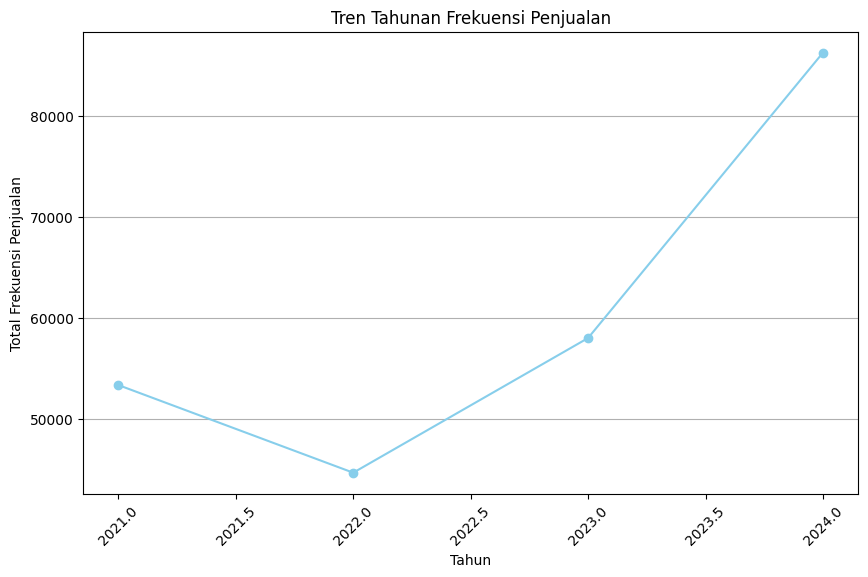

tahun
2021    53362.007359
2022    44681.656710
2023    58020.995238
2024    86283.873593
Name: frekuensi_penjualan_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends = combined_df.groupby(combined_df['tahun'])['frekuensi_penjualan_setahun'].sum()

# Langkah 3: Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
plt.plot(yearly_trends.index, yearly_trends.values, marker='o', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Mencetak yearly trends
print(yearly_trends)

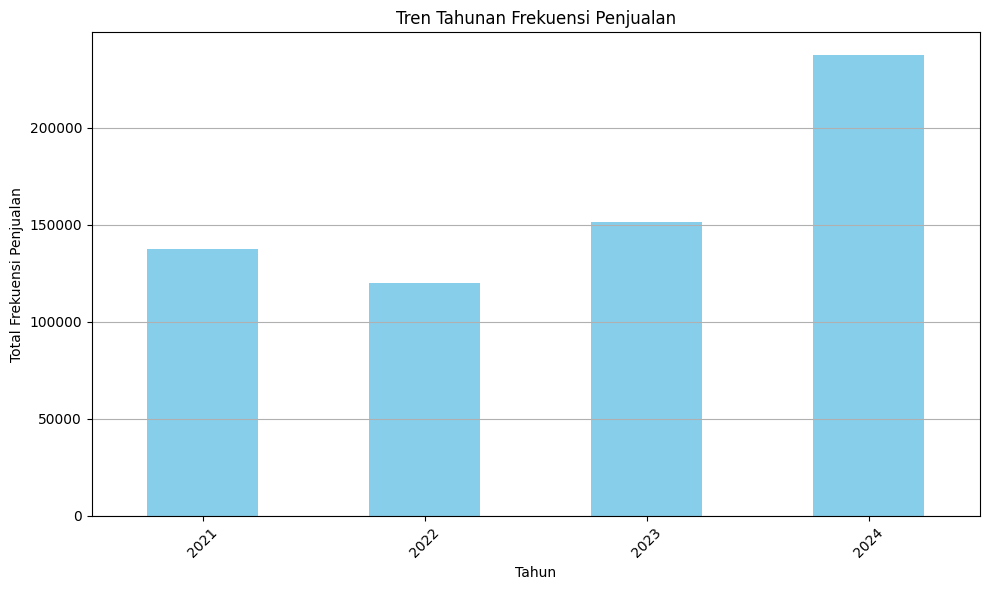

tahun
2021    137737.291861
2022    119891.227900
2023    151604.951385
2024    237391.813025
Name: revenue_setahun, dtype: float64


In [ ]:
#Langkah 2 :Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends = combined_df.groupby(combined_df['tahun'])['revenue_setahun'].sum()

#Langkah 3 :Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends)


##Harga Terendah

In [ ]:
#Langkah 2 : Memilih hanya kolom yang diinginkan
df_filtered_terendah = fresh_food_analyze[['nama', 'harga_pound', 'tahun', 'frekuensi_penjualan_setahun']]
#df_baru_rendah =df_filtered_terendah[df_filtered_terendah['tahun'] != 2024]

#Langkah 3 : Menampilkan DataFrame hasil filter
#df_baru_rendah
df_filtered_terendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.000000
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,14.400000
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.000000
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.000000
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,14.400000
...,...,...,...,...
12997,Young's Scottish Tradit…,3.75,2021,18.000000
12998,Young's Scottish Tradit…,4.00,2021,15.000000
12999,Young's Scottish Tradit…,4.00,2022,14.181818
13000,Young's Scottish Tradit…,4.00,2023,18.000000


In [ ]:
#Langkah 2 : Filter data sehingga yang tampil hanya harga terendah dari setiap produk
idx = df_filtered_terendah.groupby('nama')['harga_pound'].idxmin()
result_min = df_filtered_terendah.loc[idx]

# Menampilkan hasil
result_min

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.000000
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.000000
5,(VMD) Gu Zillionaires' Chocol…,3.59,2021,18.000000
7,(VMD) Morrisons The Best Beef Wellington,16.99,2021,12.000000
9,(VMD) Morrisons The Best Blac…,1.75,2021,12.000000
...,...,...,...,...
12983,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2021,15.272727
12986,Young's 32 Seafood Sticks,1.99,2022,12.000000
12992,Young's Red Thai Infused Salmon Fillets,4.60,2021,15.272727
12996,Young's Scottish Traditional Smoked Salmon,3.75,2021,14.000000


In [ ]:
#Langkah 2 : One-hot encoding untuk kolom 'nama'
encoder = OneHotEncoder()
nama_encoded = encoder.fit_transform(result_min[['nama']]).toarray()
nama_encoded_df = pd.DataFrame(nama_encoded, columns=encoder.get_feature_names_out(['nama']))

#Langkah 3 : Gabungkan kembali dengan dataframe asli tanpa kolom 'nama'
df_baru_encoded = pd.concat([result_min.drop('nama', axis=1), nama_encoded_df], axis=1)
df_baru_bersih = df_baru_encoded.dropna()

#Langkah 4 : Memisahkan fitur dan target
X = df_baru_bersih.drop('frekuensi_penjualan_setahun', axis=1)
y = df_baru_bersih['frekuensi_penjualan_setahun']

#Langkah 5 : Membagi data menjadi train dan test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Langkah 6 : Standarisasi fitur untuk model yang memerlukannya
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Langkah 7 : Membuat fungsi untuk evaluasi model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}")
    print()

#Langkah 8 : Modelling
# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
print("Linear Regression:")
evaluate_model(linear_model, X_test, y_test)

# Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test)

# Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Regression:")
evaluate_model(rf_model, X_test, y_test)

# Gradient Boosting Regression
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gbr_model.fit(X_train, y_train)
print("Gradient Boosting Regression:")
evaluate_model(gbr_model, X_test, y_test)

# Support Vector Regression (SVR)
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr_model.fit(X_train_scaled, y_train)
print("Support Vector Regression (SVR):")
evaluate_model(svr_model, X_test_scaled, y_test)

# XGBoost Regression
xgb_model_rendah = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model_rendah.fit(X_train, y_train)
print("XGBoost Regression:")
evaluate_model(xgb_model, X_test, y_test)

# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test_scaled, y_test)

# Decision Tree Regression
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
print("Decision Tree Regression:")
evaluate_model(dt_model, X_test, y_test)

# CatBoost Regression
catboost_model = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)
print("CatBoost Regression:")
evaluate_model(catboost_model, X_test, y_test)


Linear Regression:
Mean Squared Error (MSE): 5.359418808672807
Root Mean Squared Error (RMSE): 2.3150418589461417
Mean Absolute Error (MAE): 1.8662756577504251
R^2 Score: 0.0069901909292250375

Ridge Regression:
Mean Squared Error (MSE): 3.8977514654316394
Root Mean Squared Error (RMSE): 1.9742723888642213
Mean Absolute Error (MAE): 1.6322215105596225
R^2 Score: 0.27781246872697973

Random Forest Regression:
Mean Squared Error (MSE): 4.201267953274204
Root Mean Squared Error (RMSE): 2.049699478771023
Mean Absolute Error (MAE): 1.4754486422668238
R^2 Score: 0.2215759885409847

Gradient Boosting Regression:
Mean Squared Error (MSE): 3.689039713752653
Root Mean Squared Error (RMSE): 1.9206873024395859
Mean Absolute Error (MAE): 1.5386595879576086
R^2 Score: 0.3164832321221064

Support Vector Regression (SVR):
Mean Squared Error (MSE): 4.939249657251904
Root Mean Squared Error (RMSE): 2.222442273097752
Mean Absolute Error (MAE): 1.7796002834952867
R^2 Score: 0.08484043994404733

XGBoost Re

- R² Score: Nilai R² tertinggi menunjukkan model dengan kemampuan terbaik dalam menjelaskan variabilitas data. CatBoost Regression memiliki nilai R² tertinggi (0.35828605560697424).

- MSE dan RMSE: Nilai terendah untuk MSE dan RMSE mengindikasikan kesalahan prediksi yang paling kecil. CatBoost Regression memiliki nilai MSE (3.463423776836503) dan RMSE (1.8610276131311172) yang terendah.

- MAE: Nilai terendah untuk MAE menunjukkan kesalahan absolut rata-rata yang paling kecil. Decision Tree Regression memiliki MAE terendah (1.4092725456361814), tetapi performa keseluruhannya tidak sebaik CatBoost Regression berdasarkan MSE, RMSE, dan R².


Kesimpulan: Dari hasil di atas, CatBoost Regression tampaknya menjadi model terbaik karena memiliki nilai R² tertinggi serta nilai MSE dan RMSE terendah. Meskipun MAE dari CatBoost sedikit lebih tinggi daripada Decision Tree Regression, keseluruhan performa CatBoost lebih baik jika dilihat dari kombinasi semua metrik.

In [ ]:
#Langkah 2 : Memfilter data untuk kategori fresh_food
df_fresh_food = df_b[df_b['kategori'] == 'fresh_food']

#Langkah 3 : Mengurutkan dataframe berdasarkan tanggal secara menurun
df_fresh_food = df_fresh_food.sort_values(by='tanggal', ascending=False)

#Langkah 4 : Mengambil harga terendah untuk setiap nama produk
df_harga_terendah = df_fresh_food.groupby('nama')['harga_pound'].idxmin()

#Langkah 5 : Memilih baris-baris yang sesuai dengan indeks harga terendah
df_produk_harga_terendah = df_fresh_food.loc[df_harga_terendah]

#Langkah 6 : Mengonversi harga terendah ke dalam dataframe baru dengan hanya menyertakan nama_produk dan harga_pound
df_produk_harga_terendah = df_produk_harga_terendah[['nama', 'harga_pound']]

#Langkah 7 : Menambahkan kolom 'tahun' dengan nilai 2024 di semua baris
df_produk_harga_terendah['tahun'] = 2024

#Langkah 8 : Menampilkan dataframe baru
df_produk_harga_terendah

,nama,harga_pound,tahun
434340,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2024
252311,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2024
434049,(VMD) Gu Zillionaires' Chocol…,3.59,2024
427317,(VMD) Morrisons The Best Beef Wellington,16.99,2024
252403,(VMD) Morrisons The Best Blac…,1.75,2024
...,...,...,...
944942,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024
599656,Young's 32 Seafood Sticks,1.99,2024
962707,Young's Red Thai Infused Salmon Fillets,4.60,2024
189642,Young's Scottish Traditional Smoked Salmon,3.75,2024


In [ ]:
#Langkah 2 : Melakukan one-hot encoding pada data baru
data_baru_encoded = pd.get_dummies(df_produk_harga_terendah, columns=['nama'])

#Langkah 3 : Menambahkan kolom yang hilang jika ada
for col in X.columns:
    if col not in data_baru_encoded.columns:
        data_baru_encoded[col] = 0

#Langkah 4 : Menyusun ulang kolom agar sesuai dengan data pelatihan
data_baru_encoded = data_baru_encoded[X.columns]

#Langkah 5 : Menggunakan model untuk memprediksi frekuensi penjualan baru
prediksi_baru = xgb_model_rendah.predict(data_baru_encoded)

#Langkah 6 : Menambahkan prediksi ke DataFrame baru
df_produk_harga_terendah['frekuensi_penjualan_setahun'] = prediksi_baru
df_produk_harga_terendah


,nama,harga_pound,tahun,frekuensi_penjualan_setahun
434340,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2024,17.804453
252311,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2024,17.829258
434049,(VMD) Gu Zillionaires' Chocol…,3.59,2024,16.625086
427317,(VMD) Morrisons The Best Beef Wellington,16.99,2024,17.538441
252403,(VMD) Morrisons The Best Blac…,1.75,2024,21.600536
...,...,...,...,...
944942,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024,21.600536
599656,Young's 32 Seafood Sticks,1.99,2024,21.600536
962707,Young's Red Thai Infused Salmon Fillets,4.60,2024,17.402653
189642,Young's Scottish Traditional Smoked Salmon,3.75,2024,17.804453


In [ ]:
#Langkah 2 : Menggabungkan DataFrame berdasarkan baris
combined_df_rendah = pd.concat([df_filtered_terendah, df_produk_harga_terendah], axis=0, ignore_index=True)

#Langkah 3 : Tampilkan hasil gabungan
combined_df_rendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.000000
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,14.400000
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.000000
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.000000
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,14.400000
...,...,...,...,...
16102,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024,21.600536
16103,Young's 32 Seafood Sticks,1.99,2024,21.600536
16104,Young's Red Thai Infused Salmon Fillets,4.60,2024,17.402653
16105,Young's Scottish Traditional Smoked Salmon,3.75,2024,17.804453


In [ ]:
#Langkah 2 : Mengalikan kolom 'harga_pound' dengan kolom 'frekuensi_penjualan_setahun' untuk mendapatkan revenue setahun
combined_df_rendah['revenue_setahun'] = combined_df_rendah['harga_pound'] * combined_df_rendah['frekuensi_penjualan_setahun']

#Langkah 3 : Tampilkan DataFrame dengan kolom baru
combined_df_rendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun,revenue_setahun
0,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2021,18.000000,67.500000
1,(VMD) Gu Hot Chocolate Melting Middle Desserts,3.75,2022,14.400000,54.000000
2,(VMD) Gu Spanish Lemon Cheesecake Desserts,2.75,2021,12.000000,33.000000
3,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2021,24.000000,90.000000
4,(VMD) Gu Spanish Lemon Cheesecake Desserts,3.75,2022,14.400000,54.000000
...,...,...,...,...,...
16102,Young's 10 Seafood Sticks To Dip Marie Rose Sauce,1.90,2024,21.600536,41.041019
16103,Young's 32 Seafood Sticks,1.99,2024,21.600536,42.985067
16104,Young's Red Thai Infused Salmon Fillets,4.60,2024,17.402653,80.052203
16105,Young's Scottish Traditional Smoked Salmon,3.75,2024,17.804453,66.766698


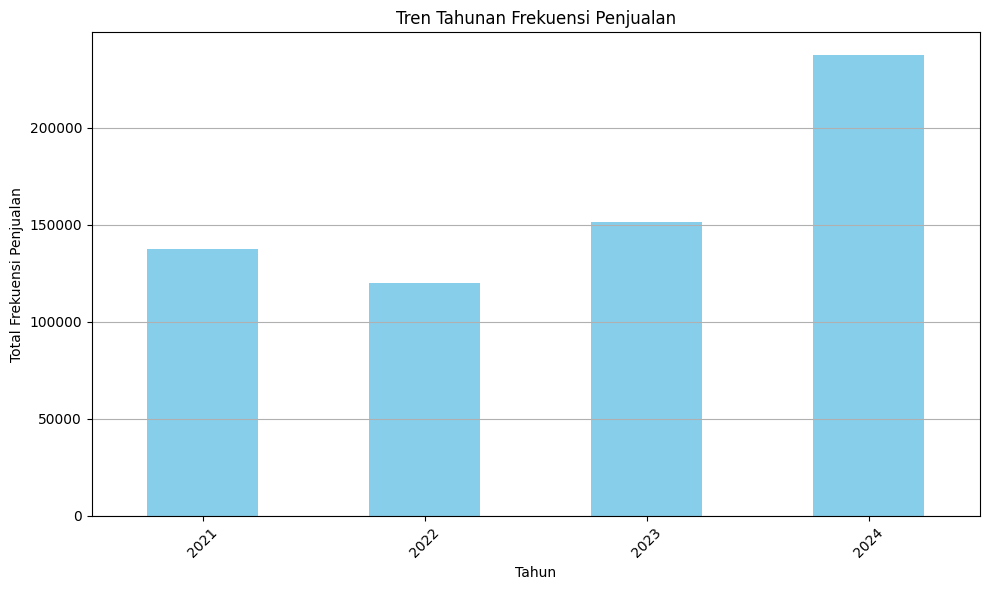

tahun
2021     53362.007359
2022     44681.656710
2023     58020.995238
2024    103165.507486
Name: frekuensi_penjualan_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends_rendah = combined_df_rendah.groupby(combined_df_rendah['tahun'])['frekuensi_penjualan_setahun'].sum()

#Langkah 3 : Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends_rendah)

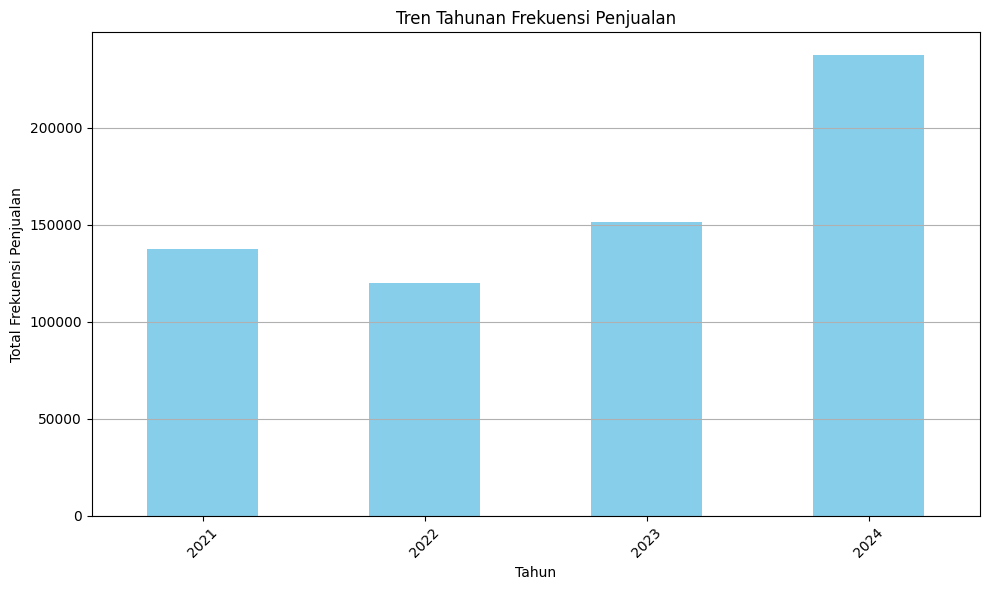

tahun
2021    137737.291861
2022    119891.227900
2023    151604.951385
2024    253860.614166
Name: revenue_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends_rendah = combined_df_rendah.groupby(combined_df_rendah['tahun'])['revenue_setahun'].sum()

#Langkah 3 : Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends_rendah)

Interpretasi: Pada kategori fresh foods dengan menggunakan harga tertinggi menghasilkan revenue sebesar 237391.813025 dimana lebih besar daripada menggunakan harga terendah dengan revenue sebesar 253860.614166. Jadi dapat dikatakan, dengan menggunakan harga tertinggi untuk modelling, akan menghasilkan akurasi yg lebih baik untuk memprediksi dan prediksi untuk tahun 2024 juga memiliki hasil (total penjualan) yang lebih bagus (meningkat) daripada menggunakan harga terendah sebagai patokan

##b. bakery

In [ ]:
#Langkah 2 : Pilih kategori produk tertentu
kategori_produk = 'bakery'

#Langkah 3 : Filter DataFrame untuk 10 produk teratas dalam kategori tertentu
produk_top10 = df_b[df_b['kategori'] == kategori_produk]['nama'].value_counts().index
produk_filter = df_b['nama'].isin(produk_top10)

#Langkah 4 : Filter DataFrame berdasarkan kategori dan rentang tahun
tahun_filter = (df_b['tahun'] >= 2021) & (df_b['tahun'] <= 2024)
kategori_filter = df_b['kategori'] == kategori_produk
df_filtered = df_b[produk_filter & tahun_filter & kategori_filter]

#Langkah 5 : Mengelompokkan berdasarkan nama produk, dan menghitung jumlah harga yang berbeda
jumlah_harga_berbeda_per_produk = df_filtered.groupby('nama')['harga_pound'].nunique()

#Langkah 6 : Filter produk yang memiliki lebih dari satu harga
produk_dengan_perubahan_harga = jumlah_harga_berbeda_per_produk[jumlah_harga_berbeda_per_produk > 1].index

#Langkah 7 : Filter DataFrame untuk hanya menyertakan produk dengan perubahan harga
df_filtered = df_filtered[df_filtered['nama'].isin(produk_dengan_perubahan_harga)]

#Langkah 8 : Mengelompokkan berdasarkan nama, harga, tahun, dan bulan
grouped = df_filtered.groupby(['nama', 'harga_pound', 'tahun', 'bulan']).size().reset_index(name='count')

#Langkah 9 : Menghitung jumlah bulan unik untuk setiap produk dan harga
jumlah_bulan_per_produk = grouped.groupby(['nama', 'harga_pound']).size().reset_index(name='jumlah_bulan')

#Langkah 10 : Menghitung frekuensi harga yang terjadi pada produk
frekuensi_harga_per_produk = df_filtered.groupby(['nama', 'harga_pound']).size().reset_index(name='frekuensi_harga')

#Langkah 11 : Gabungkan dengan DataFrame jumlah_bulan_per_produk
jumlah_bulan_per_produk = jumlah_bulan_per_produk.merge(frekuensi_harga_per_produk, on=['nama', 'harga_pound'])

#Langkah 12 : Menambahkan kolom baru untuk hasil perkalian antara harga dan frekuensi harga
jumlah_bulan_per_produk['total_harga_perubahan'] = jumlah_bulan_per_produk['harga_pound'] * jumlah_bulan_per_produk['frekuensi_harga']

#Langkah 13 : Menampilkan hasil
jumlah_bulan_per_produk

,nama,harga_pound,jumlah_bulan,frekuensi_harga,total_harga_perubahan
0,Arden Fruit Panettone,0.63,19,25,15.75
1,Arden Fruit Panettone,2.50,3,3,7.50
2,Boost Ball Chocolate Brownie Baking Mix,3.75,7,8,30.00
3,Boost Ball Chocolate Brownie Baking Mix,4.50,4,4,18.00
4,Brioche Pasquier Pancake,1.50,2,2,3.00
...,...,...,...,...,...
358,Yorkshire Baking Company Chocolate Mega Loaf,2.50,25,31,77.50
359,Yorkshire Baking Company Sultana Mega Loaf,2.00,21,25,50.00
360,Yorkshire Baking Company Sultana Mega Loaf,2.50,17,21,52.50
361,Yorkshire Baking Compan…,2.25,1,1,2.25


In [ ]:
#Langkah 2 :  Membuat plot untuk setiap produk
produk_list = jumlah_bulan_per_produk['nama'].unique()
n_produks = len(produk_list)
max_cols = 4
n_rows = math.ceil(n_produks / max_cols)

fig, axs = plt.subplots(nrows=n_rows, ncols=max_cols, figsize=(5*max_cols, 6*n_rows), constrained_layout=True)

for i, produk in enumerate(produk_list):
    row = i // max_cols
    col = i % max_cols
    produk_data = jumlah_bulan_per_produk[jumlah_bulan_per_produk['nama'] == produk]
    sns.lineplot(ax=axs[row, col], x='harga_pound', y='frekuensi_harga', data=produk_data, marker='o')
    axs[row, col].set_title(produk)
    axs[row, col].set_xlabel('Harga')
    axs[row, col].set_ylabel('Frekuensi Harga')

#Langkah 3 : Menghapus subplot kosong jika ada
for j in range(i + 1, n_rows * max_cols):
    fig.delaxes(axs.flat[j])
plt.show()

In [ ]:
#Langkah 2 :  Pilih kategori produk
kategori_produk = 'bakery'

#Langkah 3 : Filter DataFrame berdasarkan kategori
kategori_filter = df_b['kategori'] == kategori_produk
df_filtered = df_b[kategori_filter]

#Langkah 3 : Mengelompokkan berdasarkan nama produk, dan menghitung jumlah harga yang berbeda
jumlah_harga_berbeda_per_produk = df_filtered.groupby('nama')['harga_pound'].nunique()

#Langkah 4 :  Mengelompokkan berdasarkan nama, harga, tahun, dan bulan
grouped = df_filtered.groupby(['nama', 'harga_pound', 'tahun', 'bulan']).size().reset_index(name='count')

#Langkah 5 :  Menghitung jumlah bulan unik untuk setiap produk, harga, dan tahun
bakery_analyze = grouped.groupby(['nama', 'harga_pound', 'tahun']).size().reset_index(name='jumlah_bulan')

#Langkah 6 :  Menghitung frekuensi harga yang terjadi pada produk
frekuensi_penjualan_per_produk = df_filtered.groupby(['nama', 'harga_pound', 'tahun']).size().reset_index(name='frekuensi_penjualan')

#Langkah 7 : Gabungkan dengan DataFrame bakery_analyze
bakery_analyze = bakery_analyze.merge(frekuensi_penjualan_per_produk, on=['nama', 'harga_pound', 'tahun'])

#Langkah 8 : Menambahkan kolom baru untuk hasil perkalian antara harga dan frekuensi harga
bakery_analyze['penjualan'] = bakery_analyze['harga_pound'] * bakery_analyze['frekuensi_penjualan']

#Langkah 9 : Menambahkan kolom untuk menghitung frekuensi penjualan setahun
bakery_analyze['frekuensi_penjualan_setahun'] = bakery_analyze['frekuensi_penjualan'] * (12 / bakery_analyze['jumlah_bulan'])

#Langkah 10 : Menampilkan hasil
bakery_analyze

,nama,harga_pound,tahun,jumlah_bulan,frekuensi_penjualan,penjualan,frekuensi_penjualan_setahun
0,Arden Fruit Panettone,0.63,2022,7,8,5.04,13.714286
1,Arden Fruit Panettone,0.63,2023,12,17,10.71,17.000000
2,Arden Fruit Panettone,2.50,2023,1,1,2.50,12.000000
3,Arden Fruit Panettone,2.50,2024,2,2,5.00,12.000000
4,Baker Street Seeded Burger Buns,1.50,2021,11,15,22.50,16.363636
...,...,...,...,...,...,...,...
2018,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024,2,2,5.00,12.000000
2019,Yorkshire Baking Compan…,2.25,2021,1,1,2.25,12.000000
2020,Yorkshire Baking Compan…,2.50,2023,1,1,2.50,12.000000
2021,Yorkshire Baking Comp…,2.50,2021,1,1,2.50,12.000000


### Harga Tertinggi

In [ ]:
#Langkah 2 :  Memilih hanya kolom yang diinginkan
df_filtered = bakery_analyze[['nama', 'harga_pound', 'tahun', 'frekuensi_penjualan_setahun']]

df_filtered

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286
1,Arden Fruit Panettone,0.63,2023,17.000000
2,Arden Fruit Panettone,2.50,2023,12.000000
3,Arden Fruit Panettone,2.50,2024,12.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636
...,...,...,...,...
2018,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024,12.000000
2019,Yorkshire Baking Compan…,2.25,2021,12.000000
2020,Yorkshire Baking Compan…,2.50,2023,12.000000
2021,Yorkshire Baking Comp…,2.50,2021,12.000000


In [ ]:
# Menambahkan kolom 'kategori_produk' dengan nilai 'fresh_foods'
df_filtered['kategori_produk'] = 'bakery'

# Menyimpan DataFrame ke file CSV
df_filtered.to_csv('df_filtered_bakery.csv', index=False)

print("DataFrame telah disimpan ke _bakery.csv")

DataFrame telah disimpan ke _bakery.csv


<ipython-input-87-af180e47e8e4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['kategori_produk'] = 'bakery'


In [ ]:
#Langkah 2 : Filter data sehingga yang tampil hanya harga tertinggi dari setiap produk
idx = df_filtered.groupby('nama')['harga_pound'].idxmax()
result_bakery = df_filtered.loc[idx]

#Langkah 3 : Menampilkan hasil
result_bakery

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
2,Arden Fruit Panettone,2.50,2023,12.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636
8,Balconi Snack Latte,1.59,2021,16.363636
12,Balconi Trancetto Cacao,1.59,2021,16.363636
16,Barbie World Celebration Cake,12.00,2021,14.000000
...,...,...,...,...
2005,Yorkshire Baking Company Cherry Mega Loaf,2.50,2021,13.500000
2010,Yorkshire Baking Company Chocolate Mega Loaf,2.50,2022,14.181818
2016,Yorkshire Baking Company Sultana Mega Loaf,2.50,2021,13.500000
2020,Yorkshire Baking Compan…,2.50,2023,12.000000


In [ ]:
#Langkah 2 : One-hot encoding untuk kolom 'nama'
encoder = OneHotEncoder()
nama_encoded = encoder.fit_transform(result_bakery[['nama']]).toarray()
nama_encoded_df = pd.DataFrame(nama_encoded, columns=encoder.get_feature_names_out(['nama']))

#Langkah 3 : Gabungkan kembali dengan dataframe asli tanpa kolom 'nama'
df_baru_encoded = pd.concat([result_bakery.drop('nama', axis=1), nama_encoded_df], axis=1)
df_baru_bersih = df_baru_encoded.dropna()

#Langkah 4 : Memisahkan fitur dan target
X = df_baru_bersih.drop('frekuensi_penjualan_setahun', axis=1)
y = df_baru_bersih['frekuensi_penjualan_setahun']

#Langkah 5 : Membagi data menjadi train dan test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Langkah 6 : Standarisasi fitur untuk model yang memerlukannya
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Langkah 7 : Fungsi untuk evaluasi model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}")
    print()

#Langkah 8 : Model
# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
print("Linear Regression:")
evaluate_model(linear_model, X_test, y_test)

# Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test)

# Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Regression:")
evaluate_model(rf_model, X_test, y_test)

# Gradient Boosting Regression
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gbr_model.fit(X_train, y_train)
print("Gradient Boosting Regression:")
evaluate_model(gbr_model, X_test, y_test)

# Support Vector Regression (SVR)
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr_model.fit(X_train_scaled, y_train)
print("Support Vector Regression (SVR):")
evaluate_model(svr_model, X_test_scaled, y_test)

# XGBoost Regression
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
print("XGBoost Regression:")
evaluate_model(xgb_model, X_test, y_test)

# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test_scaled, y_test)

# Decision Tree Regression
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
print("Decision Tree Regression:")
evaluate_model(dt_model, X_test, y_test)

# CatBoost Regression
catboost_model = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)
print("CatBoost Regression:")
evaluate_model(catboost_model, X_test, y_test)

Linear Regression:
Mean Squared Error (MSE): 2.5110307856012453
Root Mean Squared Error (RMSE): 1.584623231434288
Mean Absolute Error (MAE): 1.3245097558812895
R^2 Score: 0.13204619068911116

Ridge Regression:
Mean Squared Error (MSE): 2.3733479764521603
Root Mean Squared Error (RMSE): 1.5405674202877848
Mean Absolute Error (MAE): 1.3081915453845976
R^2 Score: 0.1796371319721981

Random Forest Regression:
Mean Squared Error (MSE): 1.86385921368568
Root Mean Squared Error (RMSE): 1.365232292939806
Mean Absolute Error (MAE): 0.9220198537095131
R^2 Score: 0.3557451729329043

Gradient Boosting Regression:
Mean Squared Error (MSE): 1.8734668825284633
Root Mean Squared Error (RMSE): 1.3687464639327707
Mean Absolute Error (MAE): 1.0905116999370683
R^2 Score: 0.35242422090853687

Support Vector Regression (SVR):
Mean Squared Error (MSE): 3.3971923461282536
Root Mean Squared Error (RMSE): 1.843147402170606
Mean Absolute Error (MAE): 1.5243217368937232
R^2 Score: -0.17426120567366676

XGBoost Re

- R² Score: Nilai R² tertinggi menunjukkan model dengan kemampuan terbaik dalam menjelaskan variabilitas data. K-Nearest Neighbors Regression memiliki nilai R² tertinggi (0.539126510557918).

- MSE dan RMSE: Nilai terendah untuk MSE dan RMSE mengindikasikan kesalahan prediksi yang paling kecil. K-Nearest Neighbors Regression memiliki nilai MSE (1.3333284649967143) dan RMSE (1.1546984303257342) yang terendah.

- MAE: Nilai terendah untuk MAE menunjukkan kesalahan absolut rata-rata yang paling kecil. K-Nearest Neighbors Regression memiliki MAE terendah (0.8105567995223167).


Kesimpulan: Dari hasil di atas, K-Nearest Neighbors Regression (KNN) tampaknya menjadi model terbaik karena memiliki nilai R² tertinggi serta nilai MSE, RMSE, dan MAE terendah. KNN menunjukkan performa terbaik secara keseluruhan berdasarkan metrik yang diberikan.

In [ ]:
#Langkah 2 : Memfilter data untuk kategori bakery
df_bakery = df_b[df_b['kategori'] == 'bakery']

#Langkah 2 : Mengambil harga tertinggi untuk setiap nama produk
df_harga_tertinggi = df_bakery.groupby('nama')['harga_pound'].idxmax()

#Langkah 3 : Memilih baris-baris yang sesuai dengan indeks harga tertinggi
df_produk_harga_tertinggi_bakery = df_bakery.loc[df_harga_tertinggi]

#Langkah 4 : Mengonversi harga tertinggi ke dalam dataframe baru dengan hanya menyertakan nama_produk dan harga_pound
df_produk_harga_tertinggi_bakery = df_produk_harga_tertinggi_bakery[['nama', 'harga_pound']]

#Langkah 5 : Menambahkan kolom 'tahun' dengan nilai 2024 di semua baris
df_produk_harga_tertinggi_bakery['tahun'] = 2024

#Langkah 6 : Menampilkan dataframe baru
df_produk_harga_tertinggi_bakery

,nama,harga_pound,tahun
927479,Arden Fruit Panettone,2.50,2024
5094,Baker Street Seeded Burger Buns,1.50,2024
5174,Balconi Snack Latte,1.59,2024
5192,Balconi Trancetto Cacao,1.59,2024
13948,Barbie World Celebration Cake,12.00,2024
...,...,...,...
13886,Yorkshire Baking Company Cherry Mega Loaf,2.50,2024
357040,Yorkshire Baking Company Chocolate Mega Loaf,2.50,2024
13896,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024
921053,Yorkshire Baking Compan…,2.50,2024


In [ ]:
#Langkah 2 :Melakukan one-hot encoding pada data baru
data_baru_encoded = pd.get_dummies(df_produk_harga_tertinggi_bakery, columns=['nama'])

#Langkah 3 :Menambahkan kolom yang hilang jika ada
for col in X.columns:
    if col not in data_baru_encoded.columns:
        data_baru_encoded[col] = 0

#Langkah 4 :Menyusun ulang kolom agar sesuai dengan data pelatihan
data_baru_encoded = data_baru_encoded[X.columns]

#Langkah 5 :Menggunakan model untuk memprediksi frekuensi penjualan baru
prediksi_baru = knn_model.predict(data_baru_encoded)

#Langkah 6 :Menambahkan prediksi ke DataFrame baru
df_produk_harga_tertinggi_bakery['frekuensi_penjualan_setahun'] = prediksi_baru
df_produk_harga_tertinggi_bakery


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but KNeighborsRegressor was fitted without feature names
  warnings.warn(


,nama,harga_pound,tahun,frekuensi_penjualan_setahun
927479,Arden Fruit Panettone,2.50,2024,13.2
5094,Baker Street Seeded Burger Buns,1.50,2024,13.2
5174,Balconi Snack Latte,1.59,2024,13.2
5192,Balconi Trancetto Cacao,1.59,2024,13.2
13948,Barbie World Celebration Cake,12.00,2024,13.2
...,...,...,...,...
13886,Yorkshire Baking Company Cherry Mega Loaf,2.50,2024,13.2
357040,Yorkshire Baking Company Chocolate Mega Loaf,2.50,2024,13.2
13896,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024,13.2
921053,Yorkshire Baking Compan…,2.50,2024,13.2


In [ ]:
# Menambahkan kolom 'kategori_produk' dengan nilai 'fresh_foods'
df_produk_harga_tertinggi_bakery['kategori_produk'] = 'bakery'

# Menyimpan DataFrame ke file CSV
df_produk_harga_tertinggi_bakery.to_csv('df_produk_harga_tertinggi_bakery.csv', index=False)

print("DataFrame telah disimpan ke df_produk_harga_tertinggi_bakery.csv")

DataFrame telah disimpan ke df_produk_harga_tertinggi_bakery.csv


In [ ]:
#Langkah 2 :Menggabungkan DataFrame berdasarkan baris
combined_df_bakery = pd.concat([df_filtered, df_produk_harga_tertinggi_bakery], axis=0, ignore_index=True)

#Langkah 3 :Tampilkan hasil gabungan
combined_df_bakery

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286
1,Arden Fruit Panettone,0.63,2023,17.000000
2,Arden Fruit Panettone,2.50,2023,12.000000
3,Arden Fruit Panettone,2.50,2024,12.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636
...,...,...,...,...
2535,Yorkshire Baking Company Cherry Mega Loaf,2.50,2024,13.200000
2536,Yorkshire Baking Company Chocolate Mega Loaf,2.50,2024,13.200000
2537,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024,13.200000
2538,Yorkshire Baking Compan…,2.50,2024,13.200000


In [ ]:
#Langkah 2 :Mengalikan kolom 'harga_pound' dengan kolom 'frekuensi_penjualan_setahun' untuk mendapatkan revenue setahun
combined_df_bakery['revenue_setahun'] = combined_df_bakery['harga_pound'] * combined_df_bakery['frekuensi_penjualan_setahun']

#Langkah 3 :Tampilkan DataFrame dengan kolom baru
combined_df_bakery

,nama,harga_pound,tahun,frekuensi_penjualan_setahun,revenue_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286,8.640000
1,Arden Fruit Panettone,0.63,2023,17.000000,10.710000
2,Arden Fruit Panettone,2.50,2023,12.000000,30.000000
3,Arden Fruit Panettone,2.50,2024,12.000000,30.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636,24.545455
...,...,...,...,...,...
2535,Yorkshire Baking Company Cherry Mega Loaf,2.50,2024,13.200000,33.000000
2536,Yorkshire Baking Company Chocolate Mega Loaf,2.50,2024,13.200000,33.000000
2537,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024,13.200000,33.000000
2538,Yorkshire Baking Compan…,2.50,2024,13.200000,33.000000


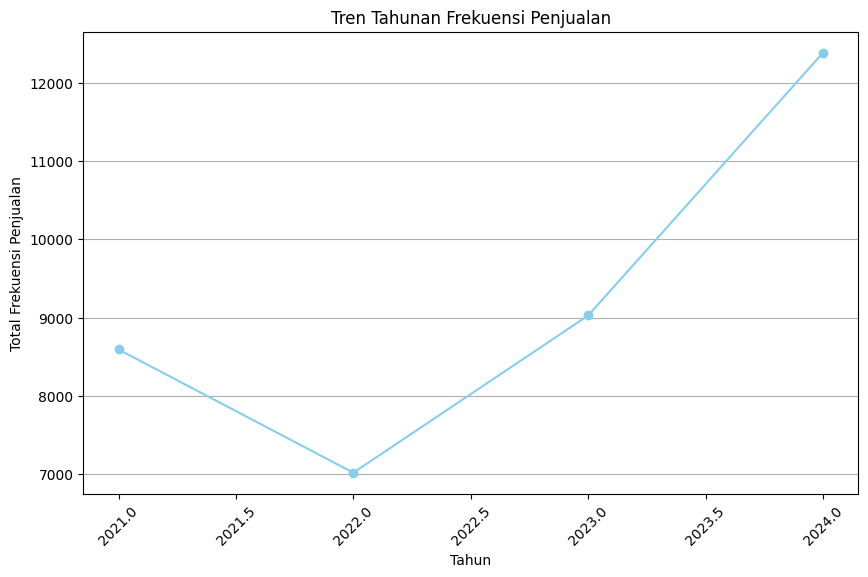

tahun
2021     8592.166234
2022     7019.308658
2023     9026.424675
2024    12380.320000
Name: frekuensi_penjualan_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends = combined_df_bakery.groupby(combined_df_bakery['tahun'])['frekuensi_penjualan_setahun'].sum()

# Langkah 3: Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
plt.plot(yearly_trends.index, yearly_trends.values, marker='o', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Mencetak yearly trends
print(yearly_trends)

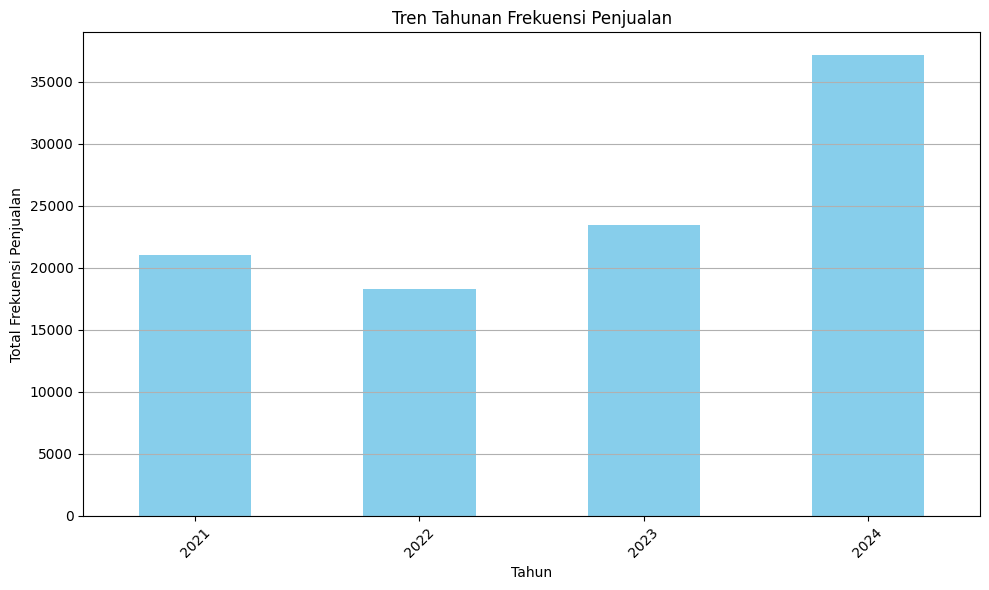

tahun
2021    21012.376684
2022    18264.170446
2023    23422.102831
2024    37131.088800
Name: revenue_setahun, dtype: float64


In [ ]:
#Langkah 2 :Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends = combined_df_bakery.groupby(combined_df_bakery['tahun'])['revenue_setahun'].sum()

#Langkah 3 :Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends)

### Harga Terendah

In [ ]:
#Langkah 2 : Memilih hanya kolom yang diinginkan
df_filtered_terendah = bakery_analyze[['nama', 'harga_pound', 'tahun', 'frekuensi_penjualan_setahun']]
#df_baru_rendah =df_filtered_terendah[df_filtered_terendah['tahun'] != 2024]

#Langkah 3 : Menampilkan DataFrame hasil filter
#df_baru_rendah
df_filtered_terendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286
1,Arden Fruit Panettone,0.63,2023,17.000000
2,Arden Fruit Panettone,2.50,2023,12.000000
3,Arden Fruit Panettone,2.50,2024,12.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636
...,...,...,...,...
2018,Yorkshire Baking Company Sultana Mega Loaf,2.50,2024,12.000000
2019,Yorkshire Baking Compan…,2.25,2021,12.000000
2020,Yorkshire Baking Compan…,2.50,2023,12.000000
2021,Yorkshire Baking Comp…,2.50,2021,12.000000


In [ ]:
#Langkah 2 : Filter data sehingga yang tampil hanya harga terendah dari setiap produk
idx = df_filtered_terendah.groupby('nama')['harga_pound'].idxmin()
result_min = df_filtered_terendah.loc[idx]

# Menampilkan hasil
result_min

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636
8,Balconi Snack Latte,1.59,2021,16.363636
12,Balconi Trancetto Cacao,1.59,2021,16.363636
16,Barbie World Celebration Cake,12.00,2021,14.000000
...,...,...,...,...
2002,Yorkshire Baking Company Cherry Mega Loaf,2.00,2021,12.000000
2008,Yorkshire Baking Company Chocolate Mega Loaf,2.25,2021,13.000000
2013,Yorkshire Baking Company Sultana Mega Loaf,2.00,2021,12.000000
2019,Yorkshire Baking Compan…,2.25,2021,12.000000


In [ ]:
#Langkah 2 : One-hot encoding untuk kolom 'nama'
encoder = OneHotEncoder()
nama_encoded = encoder.fit_transform(result_min[['nama']]).toarray()
nama_encoded_df = pd.DataFrame(nama_encoded, columns=encoder.get_feature_names_out(['nama']))

#Langkah 3 : Gabungkan kembali dengan dataframe asli tanpa kolom 'nama'
df_baru_encoded = pd.concat([result_min.drop('nama', axis=1), nama_encoded_df], axis=1)
df_baru_bersih = df_baru_encoded.dropna()

#Langkah 4 : Memisahkan fitur dan target
X = df_baru_bersih.drop('frekuensi_penjualan_setahun', axis=1)
y = df_baru_bersih['frekuensi_penjualan_setahun']

#Langkah 5 : Membagi data menjadi train dan test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Langkah 6 : Standarisasi fitur untuk model yang memerlukannya
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Langkah 7 : Membuat fungsi untuk evaluasi model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}")
    print()

#Langkah 8 : Modelling
# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
print("Linear Regression:")
evaluate_model(linear_model, X_test, y_test)

# Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test)

# Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Regression:")
evaluate_model(rf_model, X_test, y_test)

# Gradient Boosting Regression
gbr_model_rendah = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gbr_model_rendah.fit(X_train, y_train)
print("Gradient Boosting Regression:")
evaluate_model(gbr_model, X_test, y_test)

# Support Vector Regression (SVR)
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr_model.fit(X_train_scaled, y_train)
print("Support Vector Regression (SVR):")
evaluate_model(svr_model, X_test_scaled, y_test)

# XGBoost Regression
xgb_model_rendah = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model_rendah.fit(X_train, y_train)
print("XGBoost Regression:")
evaluate_model(xgb_model, X_test, y_test)

# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test_scaled, y_test)

# Decision Tree Regression
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
print("Decision Tree Regression:")
evaluate_model(dt_model, X_test, y_test)

# CatBoost Regression
catboost_model = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)
print("CatBoost Regression:")
evaluate_model(catboost_model, X_test, y_test)


Linear Regression:
Mean Squared Error (MSE): 2.4366936410224413
Root Mean Squared Error (RMSE): 1.5609912366898289
Mean Absolute Error (MAE): 1.2416466963448403
R^2 Score: -0.0180196635572496

Ridge Regression:
Mean Squared Error (MSE): 2.396367811480879
Root Mean Squared Error (RMSE): 1.5480206108062253
Mean Absolute Error (MAE): 1.237423732031925
R^2 Score: -0.0011720440077755967

Random Forest Regression:
Mean Squared Error (MSE): 2.4618838924036357
Root Mean Squared Error (RMSE): 1.569039162163786
Mean Absolute Error (MAE): 1.0329580534408114
R^2 Score: -0.028543830733737785

Gradient Boosting Regression:
Mean Squared Error (MSE): 2.131170742987037
Root Mean Squared Error (RMSE): 1.4598529867719683
Mean Absolute Error (MAE): 1.0949008554848396
R^2 Score: 0.1096239238969905

Support Vector Regression (SVR):
Mean Squared Error (MSE): 2.9073557353390806
Root Mean Squared Error (RMSE): 1.7050969870770052
Mean Absolute Error (MAE): 1.3955362891388388
R^2 Score: -0.21465631038016575

XGB

- R² Score: Nilai R² tertinggi menunjukkan model dengan kemampuan terbaik dalam menjelaskan variabilitas data. Gradient Boosting Regression memiliki nilai R² tertinggi (0.051210525062997836).

- MSE dan RMSE: Nilai terendah untuk MSE dan RMSE mengindikasikan kesalahan prediksi yang paling kecil. Gradient Boosting Regression memiliki MSE (2.2709868610686232) dan RMSE (1.5069793830934195) yang terendah.

- MAE: Nilai terendah untuk MAE menunjukkan kesalahan absolut rata-rata yang paling kecil. Random Forest Regression memiliki MAE terendah (1.0329580534408114), tetapi nilai R²-nya tidak setinggi Gradient Boosting.

Gradient Boosting Regression adalah model terbaik berdasarkan kombinasi metrik evaluasi (MSE, RMSE, dan R²). Meskipun MAE-nya sedikit lebih tinggi dibandingkan Random Forest Regression, nilai R² yang lebih tinggi menunjukkan bahwa Gradient Boosting Regression lebih baik dalam menjelaskan variabilitas data.

In [ ]:
#Langkah 2 : Memfilter data untuk kategori fresh_food
df_bakery = df_b[df_b['kategori'] == 'bakery']

#Langkah 3 : Mengurutkan dataframe berdasarkan tanggal secara menurun
df_bakery = df_bakery.sort_values(by='tanggal', ascending=False)

#Langkah 4 : Mengambil harga terendah untuk setiap nama produk
df_harga_terendah = df_bakery.groupby('nama')['harga_pound'].idxmin()

#Langkah 5 : Memilih baris-baris yang sesuai dengan indeks harga terendah
df_produk_harga_terendah = df_bakery.loc[df_harga_terendah]

#Langkah 6 : Mengonversi harga terendah ke dalam dataframe baru dengan hanya menyertakan nama_produk dan harga_pound
df_produk_harga_terendah = df_produk_harga_terendah[['nama', 'harga_pound']]

#Langkah 7 : Menambahkan kolom 'tahun' dengan nilai 2024 di semua baris
df_produk_harga_terendah['tahun'] = 2024

#Langkah 8 : Menampilkan dataframe baru
df_produk_harga_terendah

,nama,harga_pound,tahun
913816,Arden Fruit Panettone,0.63,2024
962653,Baker Street Seeded Burger Buns,1.50,2024
965531,Balconi Snack Latte,1.59,2024
966004,Balconi Trancetto Cacao,1.59,2024
977757,Barbie World Celebration Cake,12.00,2024
...,...,...,...
726691,Yorkshire Baking Company Cherry Mega Loaf,2.00,2024
334992,Yorkshire Baking Company Chocolate Mega Loaf,2.25,2024
726756,Yorkshire Baking Company Sultana Mega Loaf,2.00,2024
205501,Yorkshire Baking Compan…,2.25,2024


In [ ]:
#Langkah 2 : Melakukan one-hot encoding pada data baru
data_baru_encoded = pd.get_dummies(df_produk_harga_terendah, columns=['nama'])

#Langkah 3 : Menambahkan kolom yang hilang jika ada
for col in X.columns:
    if col not in data_baru_encoded.columns:
        data_baru_encoded[col] = 0

#Langkah 4 : Menyusun ulang kolom agar sesuai dengan data pelatihan
data_baru_encoded = data_baru_encoded[X.columns]

#Langkah 5 : Menggunakan model untuk memprediksi frekuensi penjualan baru
prediksi_baru = gbr_model_rendah.predict(data_baru_encoded)

#Langkah 6 : Menambahkan prediksi ke DataFrame baru
df_produk_harga_terendah['frekuensi_penjualan_setahun'] = prediksi_baru
df_produk_harga_terendah


,nama,harga_pound,tahun,frekuensi_penjualan_setahun
913816,Arden Fruit Panettone,0.63,2024,15.549608
962653,Baker Street Seeded Burger Buns,1.50,2024,15.965269
965531,Balconi Snack Latte,1.59,2024,15.965269
966004,Balconi Trancetto Cacao,1.59,2024,15.965269
977757,Barbie World Celebration Cake,12.00,2024,13.554852
...,...,...,...,...
726691,Yorkshire Baking Company Cherry Mega Loaf,2.00,2024,16.822904
334992,Yorkshire Baking Company Chocolate Mega Loaf,2.25,2024,16.822904
726756,Yorkshire Baking Company Sultana Mega Loaf,2.00,2024,16.822904
205501,Yorkshire Baking Compan…,2.25,2024,16.822904


In [ ]:
#Langkah 2 : Menggabungkan DataFrame berdasarkan baris
combined_df_rendah = pd.concat([df_filtered_terendah, df_produk_harga_terendah], axis=0, ignore_index=True)

#Langkah 3 : Tampilkan hasil gabungan
combined_df_rendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286
1,Arden Fruit Panettone,0.63,2023,17.000000
2,Arden Fruit Panettone,2.50,2023,12.000000
3,Arden Fruit Panettone,2.50,2024,12.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636
...,...,...,...,...
2535,Yorkshire Baking Company Cherry Mega Loaf,2.00,2024,16.822904
2536,Yorkshire Baking Company Chocolate Mega Loaf,2.25,2024,16.822904
2537,Yorkshire Baking Company Sultana Mega Loaf,2.00,2024,16.822904
2538,Yorkshire Baking Compan…,2.25,2024,16.822904


In [ ]:
#Langkah 2 : Mengalikan kolom 'harga_pound' dengan kolom 'frekuensi_penjualan_setahun' untuk mendapatkan revenue setahun
combined_df_rendah['revenue_setahun'] = combined_df_rendah['harga_pound'] * combined_df_rendah['frekuensi_penjualan_setahun']

#Langkah 3 : Tampilkan DataFrame dengan kolom baru
combined_df_rendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun,revenue_setahun
0,Arden Fruit Panettone,0.63,2022,13.714286,8.640000
1,Arden Fruit Panettone,0.63,2023,17.000000,10.710000
2,Arden Fruit Panettone,2.50,2023,12.000000,30.000000
3,Arden Fruit Panettone,2.50,2024,12.000000,30.000000
4,Baker Street Seeded Burger Buns,1.50,2021,16.363636,24.545455
...,...,...,...,...,...
2535,Yorkshire Baking Company Cherry Mega Loaf,2.00,2024,16.822904,33.645809
2536,Yorkshire Baking Company Chocolate Mega Loaf,2.25,2024,16.822904,37.851535
2537,Yorkshire Baking Company Sultana Mega Loaf,2.00,2024,16.822904,33.645809
2538,Yorkshire Baking Compan…,2.25,2024,16.822904,37.851535


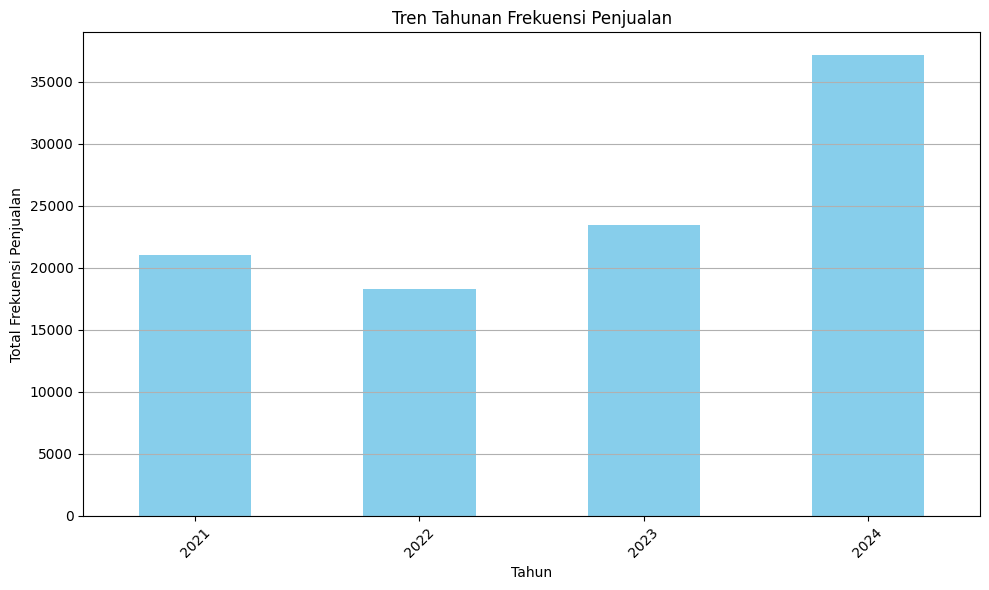

tahun
2021     8592.166234
2022     7019.308658
2023     9026.424675
2024    13647.310993
Name: frekuensi_penjualan_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends_rendah = combined_df_rendah.groupby(combined_df_rendah['tahun'])['frekuensi_penjualan_setahun'].sum()

#Langkah 3 : Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends_rendah)

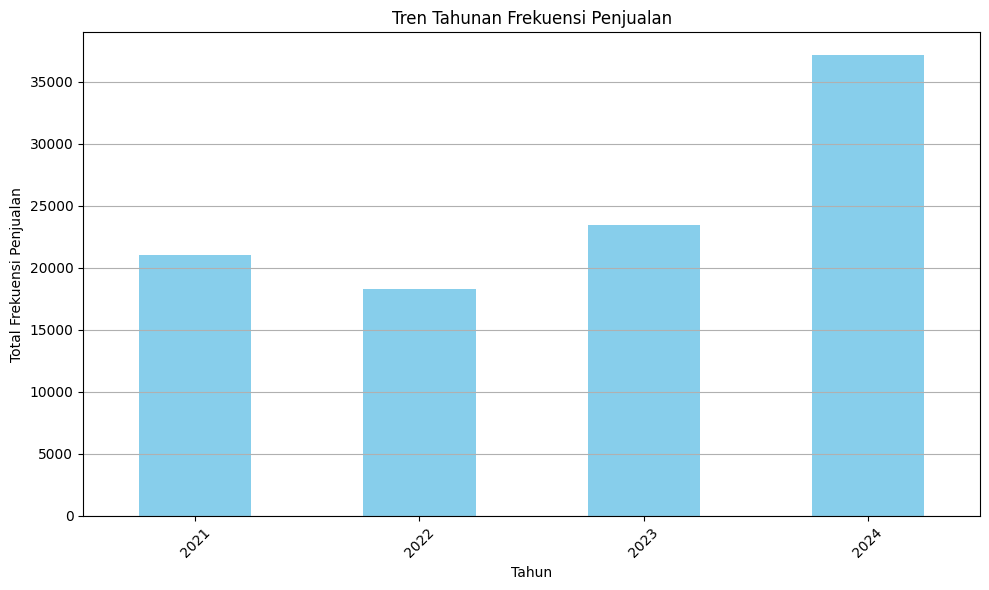

tahun
2021    21012.376684
2022    18264.170446
2023    23422.102831
2024    37566.254864
Name: revenue_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends_rendah = combined_df_rendah.groupby(combined_df_rendah['tahun'])['revenue_setahun'].sum()

#Langkah 3 : Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends_rendah)

##c. baby_products

In [ ]:
#Langkah 2 : Pilih kategori produk tertentu
kategori_produk = 'baby_products'

#Langkah 3 : Filter DataFrame untuk 10 produk teratas dalam kategori tertentu
produk_top10 = df_b[df_b['kategori'] == kategori_produk]['nama'].value_counts().index
produk_filter = df_b['nama'].isin(produk_top10)

#Langkah 4 : Filter DataFrame berdasarkan kategori dan rentang tahun
tahun_filter = (df_b['tahun'] >= 2021) & (df_b['tahun'] <= 2024)
kategori_filter = df_b['kategori'] == kategori_produk
df_filtered = df_b[produk_filter & tahun_filter & kategori_filter]

#Langkah 5 : Mengelompokkan berdasarkan nama produk, dan menghitung jumlah harga yang berbeda
jumlah_harga_berbeda_per_produk = df_filtered.groupby('nama')['harga_pound'].nunique()

#Langkah 6 : Filter produk yang memiliki lebih dari satu harga
produk_dengan_perubahan_harga = jumlah_harga_berbeda_per_produk[jumlah_harga_berbeda_per_produk > 1].index

#Langkah 7 : Filter DataFrame untuk hanya menyertakan produk dengan perubahan harga
df_filtered = df_filtered[df_filtered['nama'].isin(produk_dengan_perubahan_harga)]

#Langkah 8 : Mengelompokkan berdasarkan nama, harga, tahun, dan bulan
grouped = df_filtered.groupby(['nama', 'harga_pound', 'tahun', 'bulan']).size().reset_index(name='count')

#Langkah 9 : Menghitung jumlah bulan unik untuk setiap produk dan harga
jumlah_bulan_per_produk = grouped.groupby(['nama', 'harga_pound']).size().reset_index(name='jumlah_bulan')

#Langkah 10 : Menghitung frekuensi harga yang terjadi pada produk
frekuensi_harga_per_produk = df_filtered.groupby(['nama', 'harga_pound']).size().reset_index(name='frekuensi_harga')

#Langkah 11 : Gabungkan dengan DataFrame jumlah_bulan_per_produk
jumlah_bulan_per_produk = jumlah_bulan_per_produk.merge(frekuensi_harga_per_produk, on=['nama', 'harga_pound'])

#Langkah 12 : Menambahkan kolom baru untuk hasil perkalian antara harga dan frekuensi harga
jumlah_bulan_per_produk['total_harga_perubahan'] = jumlah_bulan_per_produk['harga_pound'] * jumlah_bulan_per_produk['frekuensi_harga']

#Langkah 13 : Menampilkan hasil
jumlah_bulan_per_produk

,nama,harga_pound,jumlah_bulan,frekuensi_harga,total_harga_perubahan
0,Always Dailies Extra Protect Panty…,1.75,17,21,36.75
1,Always Dailies Extra Protect Panty…,1.90,16,18,34.20
2,Always Dailies Fresh and Prot…,1.75,16,21,36.75
3,Always Dailies Fresh and Prot…,2.00,15,18,36.00
4,Always Discreet Underwear Incontine…,8.00,9,11,88.00
...,...,...,...,...,...
697,lights by TENA Incontinence Liners Duo,3.75,18,22,82.50
698,lights by TENA Light Incontinence Liners,1.90,16,18,34.20
699,lights by TENA Light Incontinence Liners,2.25,2,2,4.50
700,lights by TENA Long Incontinence Liners,1.90,12,14,26.60


In [ ]:
#Langkah 2 :  Membuat plot untuk setiap produk
produk_list = jumlah_bulan_per_produk['nama'].unique()
n_produks = len(produk_list)
max_cols = 4
n_rows = math.ceil(n_produks / max_cols)

fig, axs = plt.subplots(nrows=n_rows, ncols=max_cols, figsize=(5*max_cols, 6*n_rows), constrained_layout=True)

for i, produk in enumerate(produk_list):
    row = i // max_cols
    col = i % max_cols
    produk_data = jumlah_bulan_per_produk[jumlah_bulan_per_produk['nama'] == produk]
    sns.lineplot(ax=axs[row, col], x='harga_pound', y='frekuensi_harga', data=produk_data, marker='o')
    axs[row, col].set_title(produk)
    axs[row, col].set_xlabel('Harga')
    axs[row, col].set_ylabel('Frekuensi Harga')

#Langkah 3 : Menghapus subplot kosong jika ada
for j in range(i + 1, n_rows * max_cols):
    fig.delaxes(axs.flat[j])
plt.show()

In [ ]:
#Langkah 2 :  Pilih kategori produk
kategori_produk = 'baby_products'

#Langkah 3 : Filter DataFrame berdasarkan kategori
kategori_filter = df_b['kategori'] == kategori_produk
df_filtered = df_b[kategori_filter]

#Langkah 3 : Mengelompokkan berdasarkan nama produk, dan menghitung jumlah harga yang berbeda
jumlah_harga_berbeda_per_produk = df_filtered.groupby('nama')['harga_pound'].nunique()

#Langkah 4 :  Mengelompokkan berdasarkan nama, harga, tahun, dan bulan
grouped = df_filtered.groupby(['nama', 'harga_pound', 'tahun', 'bulan']).size().reset_index(name='count')

#Langkah 5 :  Menghitung jumlah bulan unik untuk setiap produk, harga, dan tahun
baby_products_analyze = grouped.groupby(['nama', 'harga_pound', 'tahun']).size().reset_index(name='jumlah_bulan')

#Langkah 6 :  Menghitung frekuensi harga yang terjadi pada produk
frekuensi_penjualan_per_produk = df_filtered.groupby(['nama', 'harga_pound', 'tahun']).size().reset_index(name='frekuensi_penjualan')

#Langkah 7 : Gabungkan dengan DataFrame baby_products_analyze
baby_products_analyze = baby_products_analyze.merge(frekuensi_penjualan_per_produk, on=['nama', 'harga_pound', 'tahun'])

#Langkah 8 : Menambahkan kolom baru untuk hasil perkalian antara harga dan frekuensi harga
baby_products_analyze['penjualan'] = baby_products_analyze['harga_pound'] * baby_products_analyze['frekuensi_penjualan']

#Langkah 9 : Menambahkan kolom untuk menghitung frekuensi penjualan setahun
baby_products_analyze['frekuensi_penjualan_setahun'] = baby_products_analyze['frekuensi_penjualan'] * (12 / baby_products_analyze['jumlah_bulan'])

#Langkah 10 : Menampilkan hasil
baby_products_analyze

,nama,harga_pound,tahun,jumlah_bulan,frekuensi_penjualan,penjualan,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,3,3,15.00,12.000000
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,4,4,20.00,12.000000
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,2,2,10.00,12.000000
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,1,1,5.00,12.000000
4,Always Dailies Extra Protect Panty…,1.75,2021,3,3,5.25,12.000000
...,...,...,...,...,...,...,...
3758,lights by TENA Light Incontinence Liners,2.25,2021,2,2,4.50,12.000000
3759,lights by TENA Long Incontinence Liners,1.90,2021,4,5,9.50,15.000000
3760,lights by TENA Long Incontinence Liners,1.90,2022,7,8,15.20,13.714286
3761,lights by TENA Long Incontinence Liners,1.90,2023,1,1,1.90,12.000000


### Harga Tertinggi

In [ ]:
#Langkah 2 :  Memilih hanya kolom yang diinginkan
df_filtered = baby_products_analyze[['nama', 'harga_pound', 'tahun', 'frekuensi_penjualan_setahun']]
#df_baru =df_filtered[df_filtered['tahun'] != 2024]

#Langkah 3 : Menampilkan DataFrame hasil filter
#df_baru
df_filtered

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.000000
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,12.000000
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,12.000000
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,12.000000
4,Always Dailies Extra Protect Panty…,1.75,2021,12.000000
...,...,...,...,...
3758,lights by TENA Light Incontinence Liners,2.25,2021,12.000000
3759,lights by TENA Long Incontinence Liners,1.90,2021,15.000000
3760,lights by TENA Long Incontinence Liners,1.90,2022,13.714286
3761,lights by TENA Long Incontinence Liners,1.90,2023,12.000000


In [ ]:
# Menambahkan kolom 'kategori_produk' dengan nilai 'fresh_foods'
df_filtered['kategori_produk'] = 'baby_products'

# Menyimpan DataFrame ke file CSV
df_filtered.to_csv('df_filtered_baby_products.csv', index=False)

print("DataFrame telah disimpan ke df_filtered_baby_products.csv")

DataFrame telah disimpan ke df_filtered_baby_products.csv


<ipython-input-93-6128479888b4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['kategori_produk'] = 'baby_products'


In [ ]:
#Langkah 2 : Filter data sehingga yang tampil hanya harga tertinggi dari setiap produk
idx = df_filtered.groupby('nama')['harga_pound'].idxmax()
result = df_filtered.loc[idx]

#Langkah 3 : Menampilkan hasil
result

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.0
8,Always Dailies Extra Protect Panty…,1.90,2021,14.0
10,Always Dailies Fresh and Protect Panty Liners ...,1.75,2023,12.0
14,Always Dailies Fresh and Prot…,2.00,2021,14.0
16,Always Discreet Incontinence Li…,2.25,2021,12.0
...,...,...,...,...
3743,Woodwards Gripe Water,4.00,2021,15.0
3750,lights by TENA Incontinence Liners,2.25,2021,12.0
3752,lights by TENA Incontinence Liners Duo,3.75,2021,14.4
3758,lights by TENA Light Incontinence Liners,2.25,2021,12.0


In [ ]:
#Langkah 2 : One-hot encoding untuk kolom 'nama'
encoder = OneHotEncoder()
nama_encoded = encoder.fit_transform(result[['nama']]).toarray()
nama_encoded_df = pd.DataFrame(nama_encoded, columns=encoder.get_feature_names_out(['nama']))

#Langkah 3 : Gabungkan kembali dengan dataframe asli tanpa kolom 'nama'
df_baru_encoded = pd.concat([result.drop('nama', axis=1), nama_encoded_df], axis=1)
df_baru_bersih = df_baru_encoded.dropna()

#Langkah 4 : Memisahkan fitur dan target
X = df_baru_bersih.drop('frekuensi_penjualan_setahun', axis=1)
y = df_baru_bersih['frekuensi_penjualan_setahun']

#Langkah 5 : Membagi data menjadi train dan test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Langkah 6 : Standarisasi fitur untuk model yang memerlukannya
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Langkah 7 : Fungsi untuk evaluasi model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}")
    print()

#Langkah 8 : Model
# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
print("Linear Regression:")
evaluate_model(linear_model, X_test, y_test)

# Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test)

# Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Regression:")
evaluate_model(rf_model, X_test, y_test)

# Gradient Boosting Regression
gbr_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
gbr_model.fit(X_train, y_train)
print("Gradient Boosting Regression:")
evaluate_model(gbr_model, X_test, y_test)

# Support Vector Regression (SVR)
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr_model.fit(X_train_scaled, y_train)
print("Support Vector Regression (SVR):")
evaluate_model(svr_model, X_test_scaled, y_test)

# XGBoost Regression
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
print("XGBoost Regression:")
evaluate_model(xgb_model, X_test, y_test)

# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test_scaled, y_test)

# Decision Tree Regression
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
print("Decision Tree Regression:")
evaluate_model(dt_model, X_test, y_test)

# CatBoost Regression
catboost_model = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)
print("CatBoost Regression:")
evaluate_model(catboost_model, X_test, y_test)

Linear Regression:
Mean Squared Error (MSE): 1.3936702739371272
Root Mean Squared Error (RMSE): 1.1805381289637058
Mean Absolute Error (MAE): 0.8711986700502269
R^2 Score: 0.025227059050720757

Ridge Regression:
Mean Squared Error (MSE): 1.3866528336539563
Root Mean Squared Error (RMSE): 1.1775622419447545
Mean Absolute Error (MAE): 0.8729871406603408
R^2 Score: 0.03013525794875571

Random Forest Regression:
Mean Squared Error (MSE): 1.120187985705526
Root Mean Squared Error (RMSE): 1.0583893355970315
Mean Absolute Error (MAE): 0.559610892982986
R^2 Score: 0.21650841116276476

Gradient Boosting Regression:
Mean Squared Error (MSE): 0.931250149177779
Root Mean Squared Error (RMSE): 0.9650130305740845
Mean Absolute Error (MAE): 0.6245541331282187
R^2 Score: 0.3486569501772766

Support Vector Regression (SVR):
Mean Squared Error (MSE): 1.2652590771133054
Root Mean Squared Error (RMSE): 1.1248373558489713
Mean Absolute Error (MAE): 0.8977090053943481
R^2 Score: 0.11504153118203941

XGBoost

- R² Score: Nilai R² tertinggi menunjukkan model dengan kemampuan terbaik dalam menjelaskan variabilitas data. XGBoost Regression memiliki nilai R² tertinggi (0.4788788029967993).

- MSE dan RMSE: Nilai terendah untuk MSE dan RMSE mengindikasikan kesalahan prediksi yang paling kecil. XGBoost Regression memiliki nilai MSE (0.7450669698264477) dan RMSE (0.8631726187886452) yang terendah.

- MAE: Nilai terendah untuk MAE menunjukkan kesalahan absolut rata-rata yang paling kecil. Random Forest Regression memiliki MAE terendah (0.559610892982986), tetapi nilai R²-nya tidak setinggi XGBoost.

Kesimpulan: Dari hasil di atas, XGBoost Regression tampaknya menjadi model terbaik karena memiliki nilai R² tertinggi serta nilai MSE dan RMSE terendah. Meskipun Random Forest Regression memiliki MAE yang lebih rendah, performa keseluruhan dari XGBoost lebih baik jika dilihat dari kombinasi semua metrik.

In [ ]:
#Langkah 2 : Memfilter data untuk kategori bakery
df_baby_products = df_b[df_b['kategori'] == 'baby_products']

#Langkah 2 : Mengambil harga tertinggi untuk setiap nama produk
df_harga_tertinggi = df_baby_products.groupby('nama')['harga_pound'].idxmax()

#Langkah 3 : Memilih baris-baris yang sesuai dengan indeks harga tertinggi
df_produk_harga_tertinggi_baby_products = df_baby_products.loc[df_harga_tertinggi]

#Langkah 4 : Mengonversi harga tertinggi ke dalam dataframe baru dengan hanya menyertakan nama_produk dan harga_pound
df_produk_harga_tertinggi_baby_products = df_produk_harga_tertinggi_baby_products[['nama', 'harga_pound']]

#Langkah 5 : Menambahkan kolom 'tahun' dengan nilai 2024 di semua baris
df_produk_harga_tertinggi_baby_products['tahun'] = 2024

#Langkah 6 : Menampilkan dataframe baru
df_produk_harga_tertinggi_baby_products

,nama,harga_pound,tahun
58839,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024
172084,Always Dailies Extra Protect Panty…,1.90,2024
732270,Always Dailies Fresh and Protect Panty Liners ...,1.75,2024
173450,Always Dailies Fresh and Prot…,2.00,2024
58841,Always Discreet Incontinence Li…,2.25,2024
...,...,...,...
10003,Woodwards Gripe Water,4.00,2024
59077,lights by TENA Incontinence Liners,2.25,2024
172035,lights by TENA Incontinence Liners Duo,3.75,2024
59089,lights by TENA Light Incontinence Liners,2.25,2024


In [ ]:
# Menambahkan kolom 'kategori_produk' dengan nilai 'fresh_foods'
df_produk_harga_tertinggi_baby_products['kategori_produk'] = 'baby_products'

# Menyimpan DataFrame ke file CSV
df_produk_harga_tertinggi_baby_products.to_csv('df_produk_harga_tertinggi_baby_products.csv', index=False)

print("DataFrame telah disimpan ke df_produk_harga_tertinggi_baby_products.csv")

DataFrame telah disimpan ke df_produk_harga_tertinggi_baby_products.csv


In [ ]:
#Langkah 2 :Melakukan one-hot encoding pada data baru
data_baru_encoded = pd.get_dummies(df_produk_harga_tertinggi_baby_products, columns=['nama'])

#Langkah 3 :Menambahkan kolom yang hilang jika ada
for col in X.columns:
    if col not in data_baru_encoded.columns:
        data_baru_encoded[col] = 0

#Langkah 4 :Menyusun ulang kolom agar sesuai dengan data pelatihan
data_baru_encoded = data_baru_encoded[X.columns]

#Langkah 5 :Menggunakan model untuk memprediksi frekuensi penjualan baru
prediksi_baru = knn_model.predict(data_baru_encoded)

#Langkah 6 :Menambahkan prediksi ke DataFrame baru
df_produk_harga_tertinggi_baby_products['frekuensi_penjualan_setahun'] = prediksi_baru
df_produk_harga_tertinggi_baby_products


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but KNeighborsRegressor was fitted without feature names
  warnings.warn(


,nama,harga_pound,tahun,frekuensi_penjualan_setahun
58839,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,14.4
172084,Always Dailies Extra Protect Panty…,1.90,2024,14.4
732270,Always Dailies Fresh and Protect Panty Liners ...,1.75,2024,14.4
173450,Always Dailies Fresh and Prot…,2.00,2024,14.4
58841,Always Discreet Incontinence Li…,2.25,2024,14.4
...,...,...,...,...
10003,Woodwards Gripe Water,4.00,2024,14.4
59077,lights by TENA Incontinence Liners,2.25,2024,14.4
172035,lights by TENA Incontinence Liners Duo,3.75,2024,14.4
59089,lights by TENA Light Incontinence Liners,2.25,2024,14.4


In [ ]:
#Langkah 2 :Menggabungkan DataFrame berdasarkan baris
combined_df_baby_products = pd.concat([df_filtered, df_produk_harga_tertinggi_baby_products], axis=0, ignore_index=True)

#Langkah 3 :Tampilkan hasil gabungan
combined_df_baby_products

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.0
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,12.0
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,12.0
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,12.0
4,Always Dailies Extra Protect Panty…,1.75,2021,12.0
...,...,...,...,...
4657,Woodwards Gripe Water,4.00,2024,14.4
4658,lights by TENA Incontinence Liners,2.25,2024,14.4
4659,lights by TENA Incontinence Liners Duo,3.75,2024,14.4
4660,lights by TENA Light Incontinence Liners,2.25,2024,14.4


In [ ]:
#Langkah 2 :Mengalikan kolom 'harga_pound' dengan kolom 'frekuensi_penjualan_setahun' untuk mendapatkan revenue setahun
combined_df_baby_products['revenue_setahun'] = combined_df_baby_products['harga_pound'] * combined_df_baby_products['frekuensi_penjualan_setahun']

#Langkah 3 :Tampilkan DataFrame dengan kolom baru
combined_df_baby_products

,nama,harga_pound,tahun,frekuensi_penjualan_setahun,revenue_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.0,60.0
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,12.0,60.0
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,12.0,60.0
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,12.0,60.0
4,Always Dailies Extra Protect Panty…,1.75,2021,12.0,21.0
...,...,...,...,...,...
4657,Woodwards Gripe Water,4.00,2024,14.4,57.6
4658,lights by TENA Incontinence Liners,2.25,2024,14.4,32.4
4659,lights by TENA Incontinence Liners Duo,3.75,2024,14.4,54.0
4660,lights by TENA Light Incontinence Liners,2.25,2024,14.4,32.4


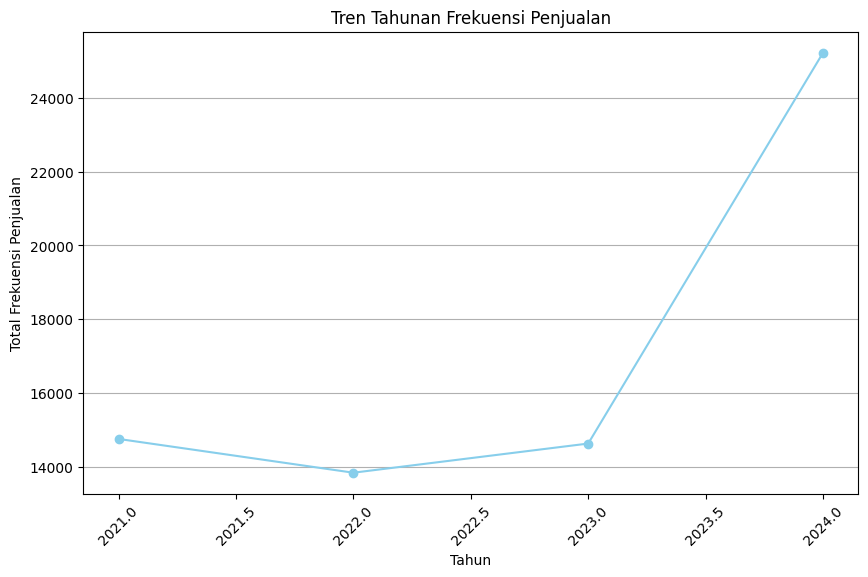

tahun
2021    14754.264069
2022    13838.517749
2023    14629.031602
2024    25228.000000
Name: frekuensi_penjualan_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends = combined_df_baby_products.groupby(combined_df_baby_products['tahun'])['frekuensi_penjualan_setahun'].sum()

# Langkah 3: Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
plt.plot(yearly_trends.index, yearly_trends.values, marker='o', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Mencetak yearly trends
print(yearly_trends)

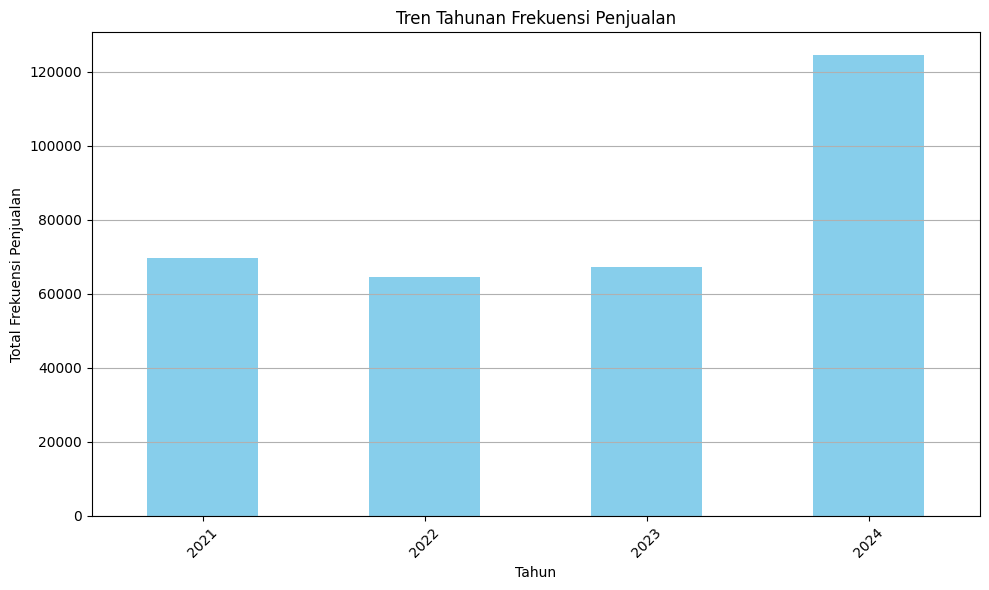

tahun
2021     69754.720745
2022     64668.629338
2023     67194.229091
2024    124392.464000
Name: revenue_setahun, dtype: float64


In [ ]:
#Langkah 2 :Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends = combined_df_baby_products.groupby(combined_df_baby_products['tahun'])['revenue_setahun'].sum()

#Langkah 3 :Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends)

### Harga Terendah

In [ ]:
#Langkah 2 : Memilih hanya kolom yang diinginkan
df_filtered_terendah = baby_products_analyze[['nama', 'harga_pound', 'tahun', 'frekuensi_penjualan_setahun']]
#df_baru_rendah =df_filtered_terendah[df_filtered_terendah['tahun'] != 2024]

#Langkah 3 : Menampilkan DataFrame hasil filter
#df_baru_rendah
df_filtered_terendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.000000
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,12.000000
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,12.000000
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,12.000000
4,Always Dailies Extra Protect Panty…,1.75,2021,12.000000
...,...,...,...,...
3758,lights by TENA Light Incontinence Liners,2.25,2021,12.000000
3759,lights by TENA Long Incontinence Liners,1.90,2021,15.000000
3760,lights by TENA Long Incontinence Liners,1.90,2022,13.714286
3761,lights by TENA Long Incontinence Liners,1.90,2023,12.000000


In [ ]:
#Langkah 2 : Filter data sehingga yang tampil hanya harga terendah dari setiap produk
idx = df_filtered_terendah.groupby('nama')['harga_pound'].idxmin()
result_min = df_filtered_terendah.loc[idx]

# Menampilkan hasil
result_min

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.0
4,Always Dailies Extra Protect Panty…,1.75,2021,12.0
10,Always Dailies Fresh and Protect Panty Liners ...,1.75,2023,12.0
11,Always Dailies Fresh and Prot…,1.75,2021,12.0
16,Always Discreet Incontinence Li…,2.25,2021,12.0
...,...,...,...,...
3743,Woodwards Gripe Water,4.00,2021,15.0
3747,lights by TENA Incontinence Liners,1.90,2021,14.0
3751,lights by TENA Incontinence Liners Duo,3.00,2021,12.0
3755,lights by TENA Light Incontinence Liners,1.90,2021,14.4


In [ ]:
#Langkah 2 : One-hot encoding untuk kolom 'nama'
encoder = OneHotEncoder()
nama_encoded = encoder.fit_transform(result_min[['nama']]).toarray()
nama_encoded_df = pd.DataFrame(nama_encoded, columns=encoder.get_feature_names_out(['nama']))

#Langkah 3 : Gabungkan kembali dengan dataframe asli tanpa kolom 'nama'
df_baru_encoded = pd.concat([result_min.drop('nama', axis=1), nama_encoded_df], axis=1)
df_baru_bersih = df_baru_encoded.dropna()

#Langkah 4 : Memisahkan fitur dan target
X = df_baru_bersih.drop('frekuensi_penjualan_setahun', axis=1)
y = df_baru_bersih['frekuensi_penjualan_setahun']

#Langkah 5 : Membagi data menjadi train dan test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Langkah 6 : Standarisasi fitur untuk model yang memerlukannya
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Langkah 7 : Membuat fungsi untuk evaluasi model
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Mean Squared Error (RMSE): {rmse}")
    print(f"Mean Absolute Error (MAE): {mae}")
    print(f"R^2 Score: {r2}")
    print()

#Langkah 8 : Modelling
# Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)
print("Linear Regression:")
evaluate_model(linear_model, X_test, y_test)

# Ridge Regression
ridge_model = Ridge(alpha=1.0)
ridge_model.fit(X_train, y_train)
print("Ridge Regression:")
evaluate_model(ridge_model, X_test, y_test)

# Random Forest Regression
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest Regression:")
evaluate_model(rf_model, X_test, y_test)

# Gradient Boosting Regression
# gbr_model_rendah = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
# gbr_model_rendah.fit(X_train, y_train)
# print("Gradient Boosting Regression:")
# evaluate_model(gbr_model, X_test, y_test)

# Support Vector Regression (SVR)
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.2)
svr_model.fit(X_train_scaled, y_train)
print("Support Vector Regression (SVR):")
evaluate_model(svr_model, X_test_scaled, y_test)

# XGBoost Regression
# xgb_model_rendah = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
# xgb_model_rendah.fit(X_train, y_train)
# print("XGBoost Regression:")
# evaluate_model(xgb_model, X_test, y_test)

# K-Nearest Neighbors Regression
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
print("K-Nearest Neighbors Regression:")
evaluate_model(knn_model, X_test_scaled, y_test)

# Decision Tree Regression
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
print("Decision Tree Regression:")
evaluate_model(dt_model, X_test, y_test)

# CatBoost Regression
catboost_model = CatBoostRegressor(n_estimators=100, learning_rate=0.1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)
print("CatBoost Regression:")
evaluate_model(catboost_model, X_test, y_test)


Linear Regression:
Mean Squared Error (MSE): 1.8312636419140595
Root Mean Squared Error (RMSE): 1.3532419007383933
Mean Absolute Error (MAE): 1.2542547691421946
R^2 Score: 0.018528079984627244

Ridge Regression:
Mean Squared Error (MSE): 1.4786610826574482
Root Mean Squared Error (RMSE): 1.2160020899066943
Mean Absolute Error (MAE): 0.9486602579904355
R^2 Score: 0.20750660984513625

Random Forest Regression:
Mean Squared Error (MSE): 1.1833704658440996
Root Mean Squared Error (RMSE): 1.0878283255385932
Mean Absolute Error (MAE): 0.594105506896205
R^2 Score: 0.365768611019035

Support Vector Regression (SVR):
Mean Squared Error (MSE): 1.4366213989663832
Root Mean Squared Error (RMSE): 1.1985914228653496
Mean Absolute Error (MAE): 1.0287825655910674
R^2 Score: 0.2300379199878868

K-Nearest Neighbors Regression:
Mean Squared Error (MSE): 1.1266782159080555
Root Mean Squared Error (RMSE): 1.0614509955283171
Mean Absolute Error (MAE): 0.7000503372596395
R^2 Score: 0.3961530134181145

Decisi

- R² Score: Nilai R² tertinggi menunjukkan model dengan kemampuan terbaik dalam menjelaskan variabilitas data. CatBoost Regression memiliki nilai R² tertinggi (0.4139444230320076).

- MSE dan RMSE: Nilai terendah untuk MSE dan RMSE mengindikasikan kesalahan prediksi yang paling kecil. CatBoost Regression memiliki MSE (1.093482399604098) dan RMSE (1.0456970878816187) yang terendah.

- MAE: Nilai terendah untuk MAE menunjukkan kesalahan absolut rata-rata yang paling kecil. Random Forest Regression memiliki MAE terendah (0.594105506896205), tetapi nilai R²-nya tidak setinggi CatBoost Regression.

Kesimpulan :
CatBoost Regression adalah model terbaik berdasarkan kombinasi metrik evaluasi (MSE, RMSE, dan R²). Meskipun MAE-nya sedikit lebih tinggi dibandingkan Random Forest Regression, nilai R² yang lebih tinggi menunjukkan bahwa CatBoost Regression lebih baik dalam menjelaskan variabilitas data.

In [ ]:
#Langkah 2 : Memfilter data untuk kategori fresh_food
df_baby_products= df_b[df_b['kategori'] == 'baby_products']

#Langkah 3 : Mengurutkan dataframe berdasarkan tanggal secara menurun
df_baby_products= df_baby_products.sort_values(by='tanggal', ascending=False)

#Langkah 4 : Mengambil harga terendah untuk setiap nama produk
df_harga_terendah = df_baby_products.groupby('nama')['harga_pound'].idxmin()

#Langkah 5 : Memilih baris-baris yang sesuai dengan indeks harga terendah
df_produk_harga_terendah = df_baby_products.loc[df_harga_terendah]

#Langkah 6 : Mengonversi harga terendah ke dalam dataframe baru dengan hanya menyertakan nama_produk dan harga_pound
df_produk_harga_terendah = df_produk_harga_terendah[['nama', 'harga_pound']]

#Langkah 7 : Menambahkan kolom 'tahun' dengan nilai 2024 di semua baris
df_produk_harga_terendah['tahun'] = 2024

#Langkah 8 : Menampilkan dataframe baru
df_produk_harga_terendah

,nama,harga_pound,tahun
945865,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024
962520,Always Dailies Extra Protect Panty…,1.75,2024
769645,Always Dailies Fresh and Protect Panty Liners ...,1.75,2024
925597,Always Dailies Fresh and Prot…,1.75,2024
854261,Always Discreet Incontinence Li…,2.25,2024
...,...,...,...
969482,Woodwards Gripe Water,4.00,2024
871032,lights by TENA Incontinence Liners,1.90,2024
102668,lights by TENA Incontinence Liners Duo,3.00,2024
852761,lights by TENA Light Incontinence Liners,1.90,2024


In [ ]:
#Langkah 2 : Melakukan one-hot encoding pada data baru
data_baru_encoded = pd.get_dummies(df_produk_harga_terendah, columns=['nama'])

#Langkah 3 : Menambahkan kolom yang hilang jika ada
for col in X.columns:
    if col not in data_baru_encoded.columns:
        data_baru_encoded[col] = 0

#Langkah 4 : Menyusun ulang kolom agar sesuai dengan data pelatihan
data_baru_encoded = data_baru_encoded[X.columns]

#Langkah 5 : Menggunakan model untuk memprediksi frekuensi penjualan baru
prediksi_baru = gbr_model_rendah.predict(data_baru_encoded)

#Langkah 6 : Menambahkan prediksi ke DataFrame baru
df_produk_harga_terendah['frekuensi_penjualan_setahun'] = prediksi_baru
df_produk_harga_terendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
945865,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,10.982849
962520,Always Dailies Extra Protect Panty…,1.75,2024,11.897668
769645,Always Dailies Fresh and Protect Panty Liners ...,1.75,2024,11.897668
925597,Always Dailies Fresh and Prot…,1.75,2024,11.897668
854261,Always Discreet Incontinence Li…,2.25,2024,11.035105
...,...,...,...,...
969482,Woodwards Gripe Water,4.00,2024,12.019369
871032,lights by TENA Incontinence Liners,1.90,2024,12.019369
102668,lights by TENA Incontinence Liners Duo,3.00,2024,12.019369
852761,lights by TENA Light Incontinence Liners,1.90,2024,12.019369


In [ ]:
#Langkah 2 : Menggabungkan DataFrame berdasarkan baris
combined_df_rendah = pd.concat([df_filtered_terendah, df_produk_harga_terendah], axis=0, ignore_index=True)

#Langkah 3 : Tampilkan hasil gabungan
combined_df_rendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.000000
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,12.000000
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,12.000000
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,12.000000
4,Always Dailies Extra Protect Panty…,1.75,2021,12.000000
...,...,...,...,...
4657,Woodwards Gripe Water,4.00,2024,12.019369
4658,lights by TENA Incontinence Liners,1.90,2024,12.019369
4659,lights by TENA Incontinence Liners Duo,3.00,2024,12.019369
4660,lights by TENA Light Incontinence Liners,1.90,2024,12.019369


In [ ]:
#Langkah 2 : Mengalikan kolom 'harga_pound' dengan kolom 'frekuensi_penjualan_setahun' untuk mendapatkan revenue setahun
combined_df_rendah['revenue_setahun'] = combined_df_rendah['harga_pound'] * combined_df_rendah['frekuensi_penjualan_setahun']

#Langkah 3 : Tampilkan DataFrame dengan kolom baru
combined_df_rendah

,nama,harga_pound,tahun,frekuensi_penjualan_setahun,revenue_setahun
0,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2021,12.000000,60.000000
1,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2022,12.000000,60.000000
2,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2023,12.000000,60.000000
3,Abidec Kid Multivitamin Syrup - Food Suppleme…,5.00,2024,12.000000,60.000000
4,Always Dailies Extra Protect Panty…,1.75,2021,12.000000,21.000000
...,...,...,...,...,...
4657,Woodwards Gripe Water,4.00,2024,12.019369,48.077478
4658,lights by TENA Incontinence Liners,1.90,2024,12.019369,22.836802
4659,lights by TENA Incontinence Liners Duo,3.00,2024,12.019369,36.058108
4660,lights by TENA Light Incontinence Liners,1.90,2024,12.019369,22.836802


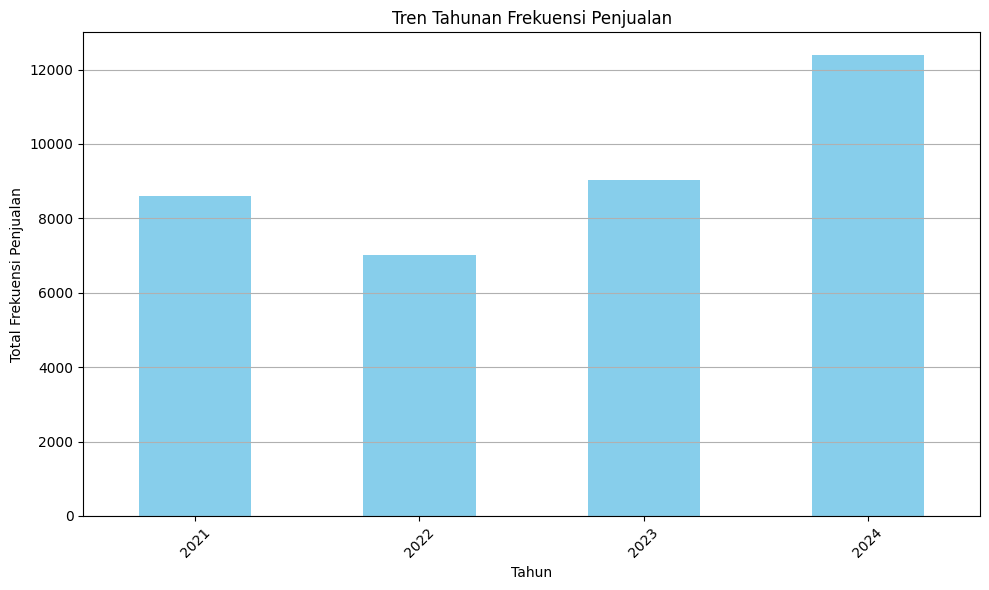

tahun
2021    14754.264069
2022    13838.517749
2023    14629.031602
2024    23487.432116
Name: frekuensi_penjualan_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends_rendah = combined_df_rendah.groupby(combined_df_rendah['tahun'])['frekuensi_penjualan_setahun'].sum()

#Langkah 3 : Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends_rendah)

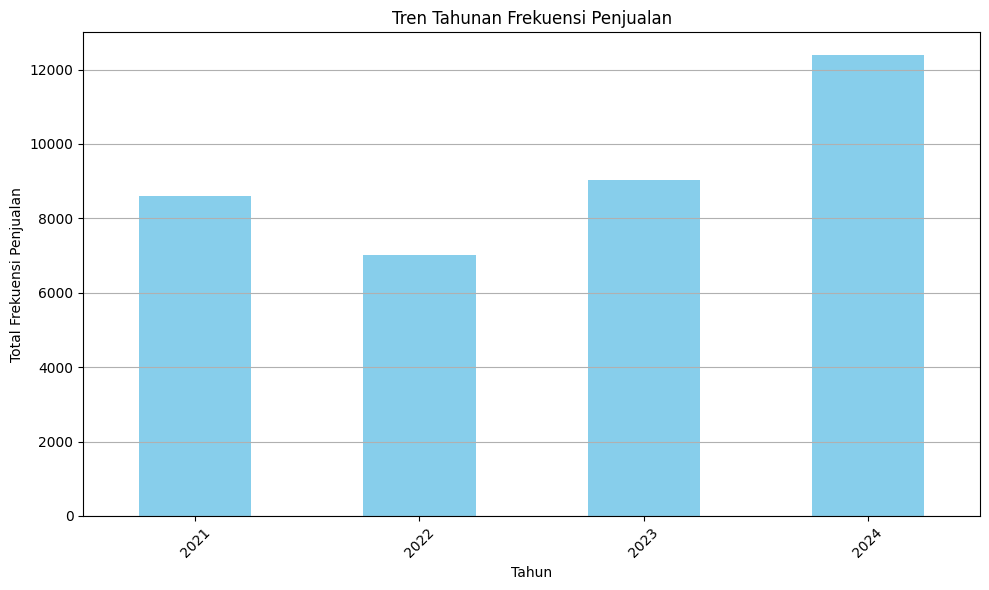

tahun
2021     69754.720745
2022     64668.629338
2023     67194.229091
2024    107834.683284
Name: revenue_setahun, dtype: float64


In [ ]:
#Langkah 2 : Mengelompokkan data berdasarkan tahun dan menghitung total frekuensi penjualan
yearly_trends_rendah = combined_df_rendah.groupby(combined_df_rendah['tahun'])['revenue_setahun'].sum()

#Langkah 3 : Membuat plot tren tahunan
plt.figure(figsize=(10, 6))
yearly_trends.plot(kind='bar', color='skyblue')
plt.title('Tren Tahunan Frekuensi Penjualan')
plt.xlabel('Tahun')
plt.ylabel('Total Frekuensi Penjualan')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()
print(yearly_trends_rendah)